In [2]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoTokenizer, AutoModel
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import time

In [3]:
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

tokenizer_config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/420 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/14.0M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


RobertaModel(
  (embeddings): RobertaEmbeddings(
    (word_embeddings): Embedding(600, 384, padding_idx=1)
    (position_embeddings): Embedding(515, 384, padding_idx=1)
    (token_type_embeddings): Embedding(1, 384)
    (LayerNorm): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.144, inplace=False)
  )
  (encoder): RobertaEncoder(
    (layer): ModuleList(
      (0-2): 3 x RobertaLayer(
        (attention): RobertaAttention(
          (self): RobertaSelfAttention(
            (query): Linear(in_features=384, out_features=384, bias=True)
            (key): Linear(in_features=384, out_features=384, bias=True)
            (value): Linear(in_features=384, out_features=384, bias=True)
            (dropout): Dropout(p=0.109, inplace=False)
          )
          (output): RobertaSelfOutput(
            (dense): Linear(in_features=384, out_features=384, bias=True)
            (LayerNorm): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
            (dropou

In [4]:
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.to(dtype=torch.float32)

In [5]:
df = pd.read_excel('/kaggle/input/tg-data/tg_raw.xlsx')  
smiles = df["SMILES"].values
target = df["tg"].values 

features = featurize_smiles(smiles)

In [6]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x
'''
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.fc5 = nn.Linear(32, 1)
        self.dropout = nn.Dropout(0.3)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.activation(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.activation(self.bn3(self.fc3(x)))
        x = self.dropout(x)
        x = self.activation(self.fc4(x))
        x = self.fc5(x)
        return x
'''
input_dim = features.shape[1] 
model = PredictionModel(input_dim).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [7]:
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

<ipython-input-7-b9c177676731>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
<ipython-input-7-b9c177676731>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
<ipython-input-7-b9c177676731>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_tensor = TensorDataset(torc

In [8]:
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/ChemBERTa-77M-MTR_80_best_model.pth"

count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 
        
    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break
        
    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path) 

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

Epoch 1/100, Train Loss: 16821.1498, Validation Loss: 5793.4047
Epoch 2/100, Train Loss: 4747.5278, Validation Loss: 3509.2126
Epoch 3/100, Train Loss: 3387.5173, Validation Loss: 2823.2531
Epoch 4/100, Train Loss: 2975.9238, Validation Loss: 2594.5264
Epoch 5/100, Train Loss: 2777.0087, Validation Loss: 2469.3384
Epoch 6/100, Train Loss: 2631.0894, Validation Loss: 2379.5488
Epoch 7/100, Train Loss: 2538.6982, Validation Loss: 2296.3676
Epoch 8/100, Train Loss: 2453.2362, Validation Loss: 2235.5984
Epoch 9/100, Train Loss: 2375.2774, Validation Loss: 2186.6218
Epoch 10/100, Train Loss: 2316.3576, Validation Loss: 2103.4439
Epoch 11/100, Train Loss: 2250.5664, Validation Loss: 2136.7415
Epoch 12/100, Train Loss: 2210.5223, Validation Loss: 2057.1894
Epoch 13/100, Train Loss: 2150.1737, Validation Loss: 2049.0083
Epoch 14/100, Train Loss: 2112.1584, Validation Loss: 2022.3663
Epoch 15/100, Train Loss: 2072.4462, Validation Loss: 1979.2404
Epoch 16/100, Train Loss: 2033.7521, Validation 

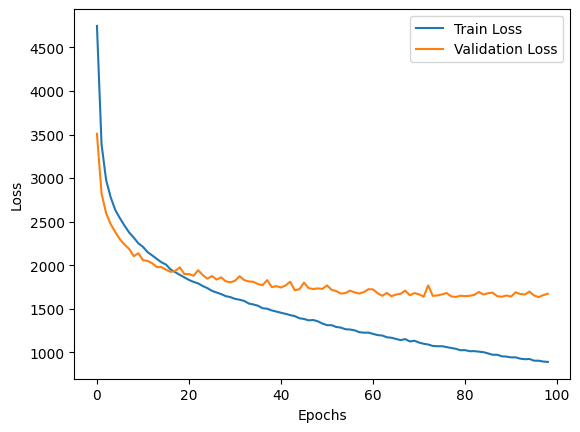

In [9]:
import matplotlib.pyplot as plt

plt.plot(train_losses[1:], label='Train Loss')
plt.plot(val_losses[1:], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [12]:
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1) 
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

Mean Squared Error (MSE): 1606.8765
Mean Absolute Error (MAE): 27.9798
R-Squared (R²): 0.8665


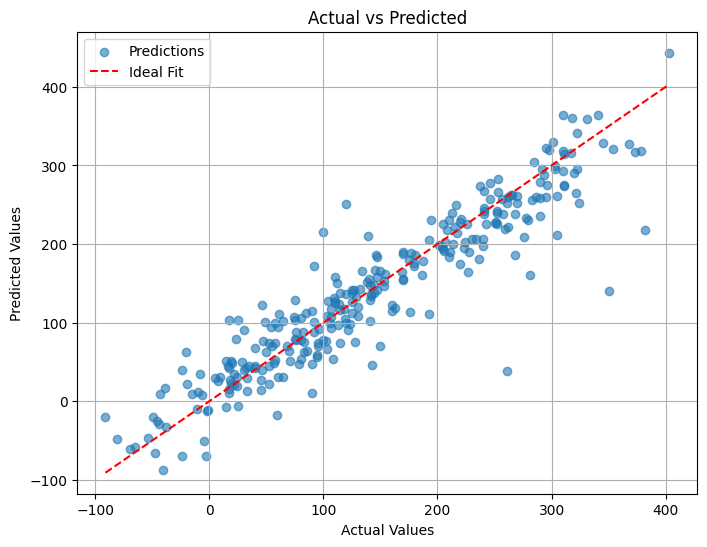

In [11]:
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()

tokenizer_config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/420 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/14.0M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


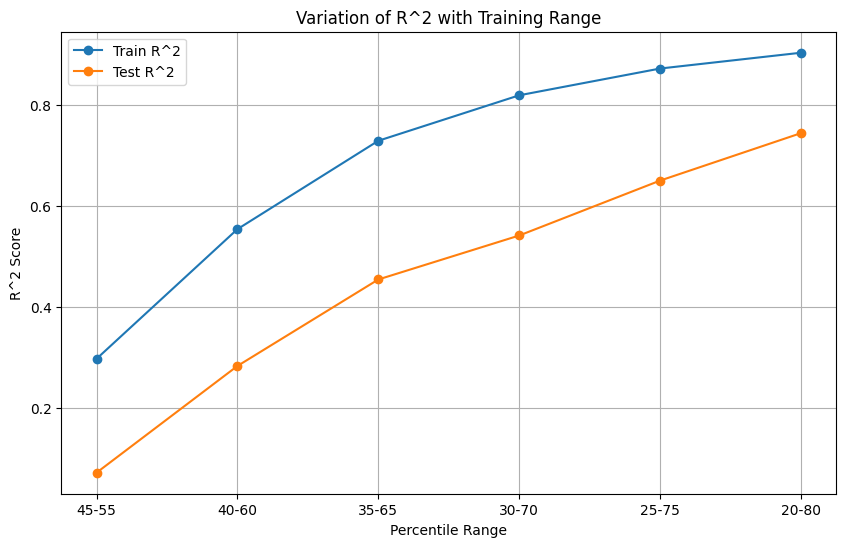

In [1]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.to(dtype=torch.float32)

# Load dataset
df = pd.read_excel('/kaggle/input/entiredata/entire_data.xlsx')
smiles = df["SMILES_1"].values
target = df["gap"].values

# Generate ChemBERTa embeddings
features = featurize_smiles(smiles)

# Define the model class
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Define percentile ranges
percentile_ranges = [(45, 55), (40, 60), (35, 65), (30, 70), (25, 75), (20, 80)]

# Initialize lists to store results
train_r2_scores = []
test_r2_scores = []

# Iterate through each range
for lower_percentile, upper_percentile in percentile_ranges:
    lower_bound = np.percentile(target, lower_percentile)
    upper_bound = np.percentile(target, upper_percentile)

    # Split data into training and testing sets
    train_mask = (target >= lower_bound) & (target <= upper_bound)
    test_mask = ~train_mask

    X_train, y_train = features[train_mask], target[train_mask]
    X_test, y_test = features[test_mask], target[test_mask]

    # Convert to PyTorch tensors
    train_tensor = TensorDataset(X_train, torch.tensor(y_train, dtype=torch.float32).to(device))
    test_tensor = TensorDataset(X_test, torch.tensor(y_test, dtype=torch.float32).to(device))

    train_loader = DataLoader(train_tensor, batch_size=32, shuffle=True)
    test_loader = DataLoader(test_tensor, batch_size=32, shuffle=False)

    # Initialize model, criterion, and optimizer
    input_dim = features.shape[1]
    model = PredictionModel(input_dim).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Train the model
    model.train()
    for epoch in range(20):  # Using fewer epochs for efficiency
        for batch_X, batch_y in train_loader:
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            loss.backward()
            optimizer.step()

    # Evaluate the model
    model.eval()
    with torch.no_grad():
        # Training set predictions
        train_predictions = []
        train_actuals = []
        for batch_X, batch_y in train_loader:
            outputs = model(batch_X).squeeze()
            train_predictions.extend(outputs.cpu().numpy())
            train_actuals.extend(batch_y.cpu().numpy())

        train_r2 = r2_score(train_actuals, train_predictions)
        train_r2_scores.append(train_r2)

        # Testing set predictions
        test_predictions = []
        test_actuals = []
        for batch_X, batch_y in test_loader:
            outputs = model(batch_X).squeeze()
            test_predictions.extend(outputs.cpu().numpy())
            test_actuals.extend(batch_y.cpu().numpy())

        test_r2 = r2_score(test_actuals, test_predictions)
        test_r2_scores.append(test_r2)

# Plot the R^2 variation
plt.figure(figsize=(10, 6))
plt.plot([f"{low}-{high}" for low, high in percentile_ranges], train_r2_scores, label="Train R^2", marker="o")
plt.plot([f"{low}-{high}" for low, high in percentile_ranges], test_r2_scores, label="Test R^2", marker="o")
plt.xlabel("Percentile Range")
plt.ylabel("R^2 Score")
plt.title("Variation of R^2 with Training Range")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


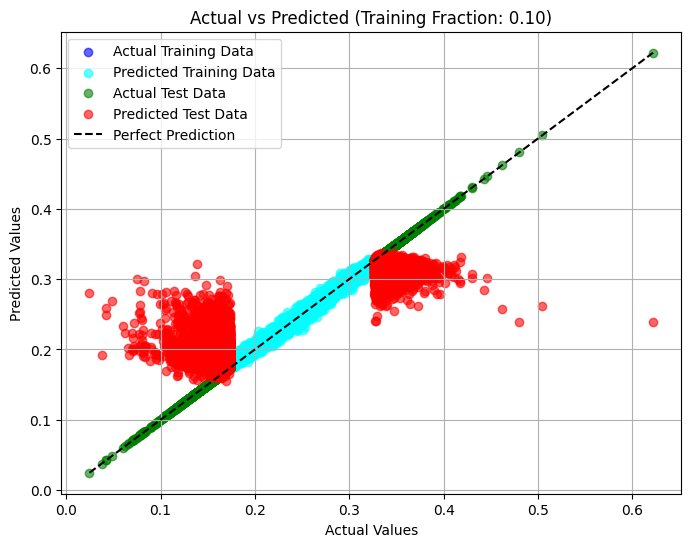

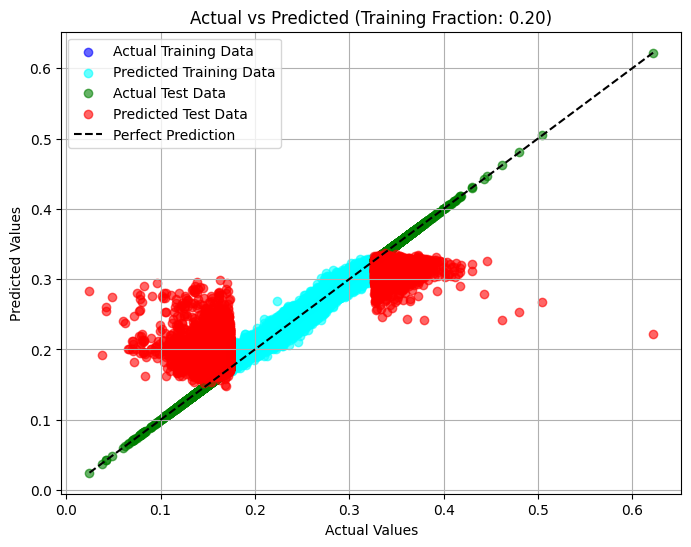

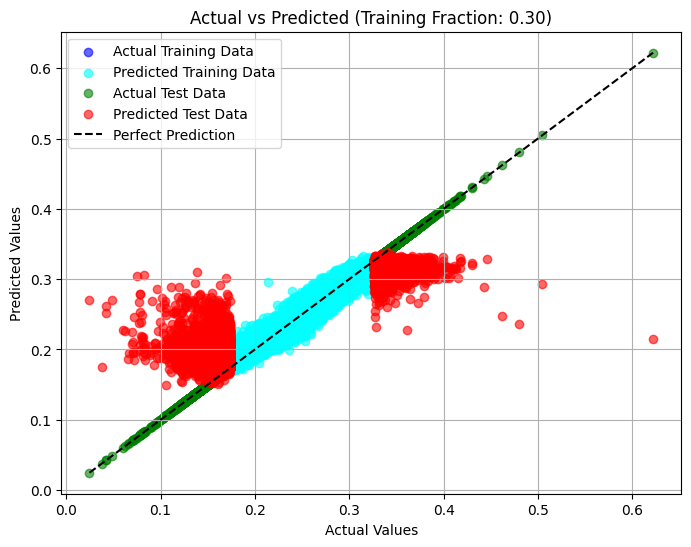

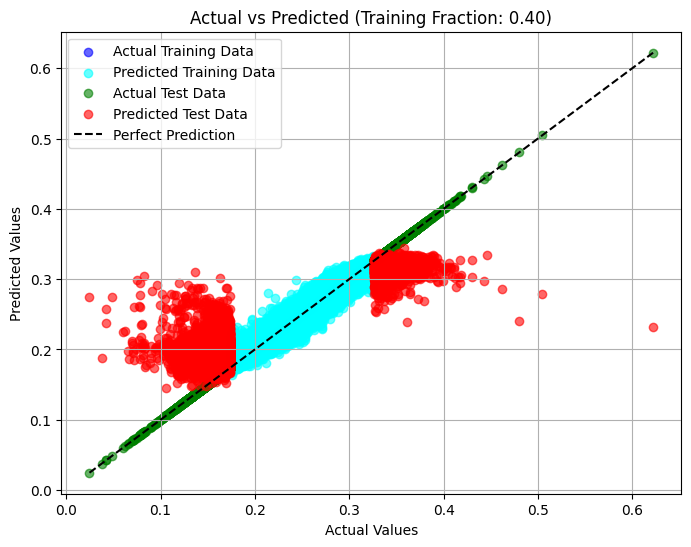

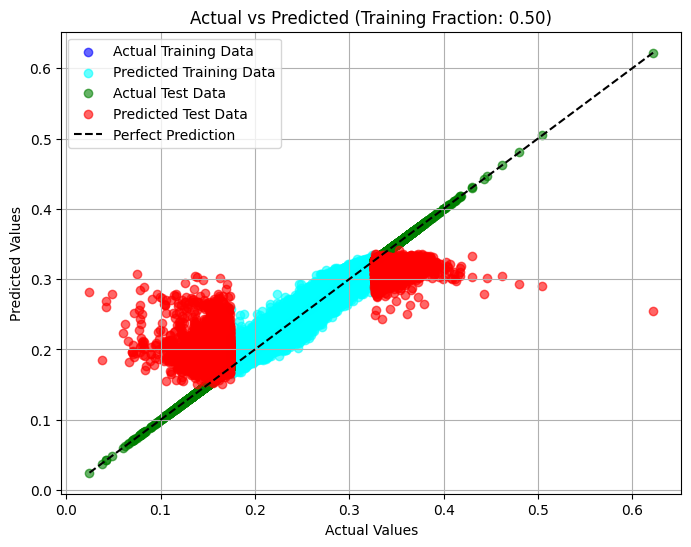

...

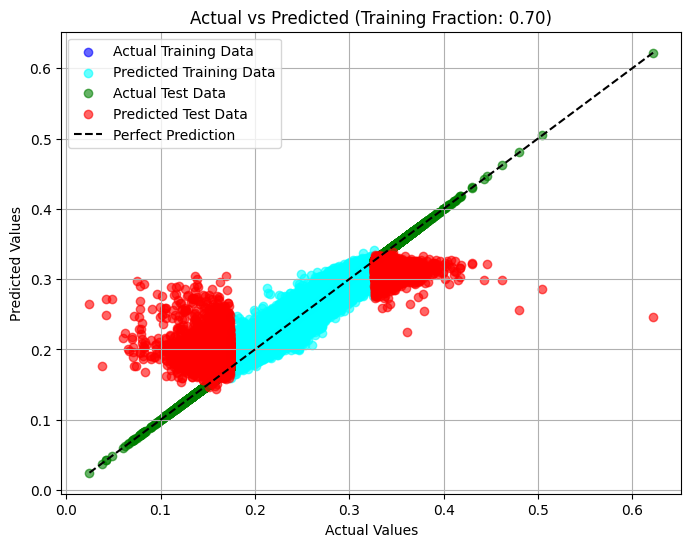

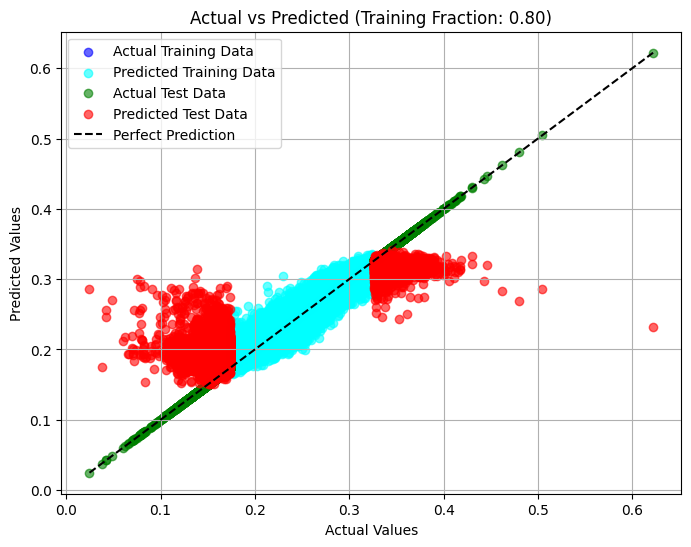

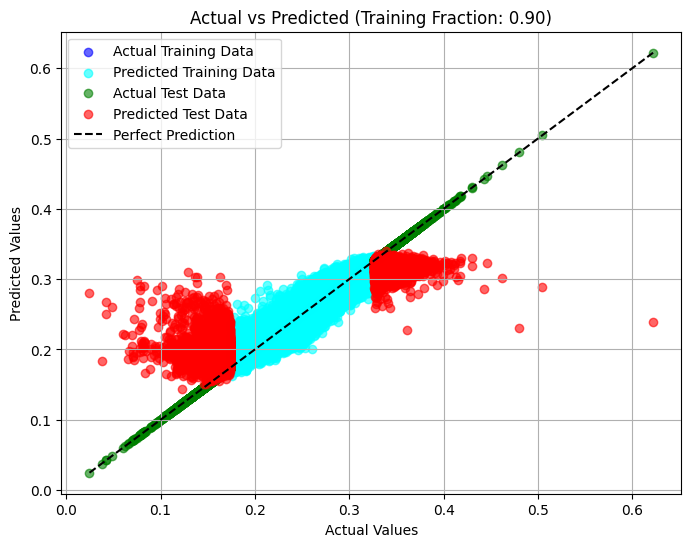

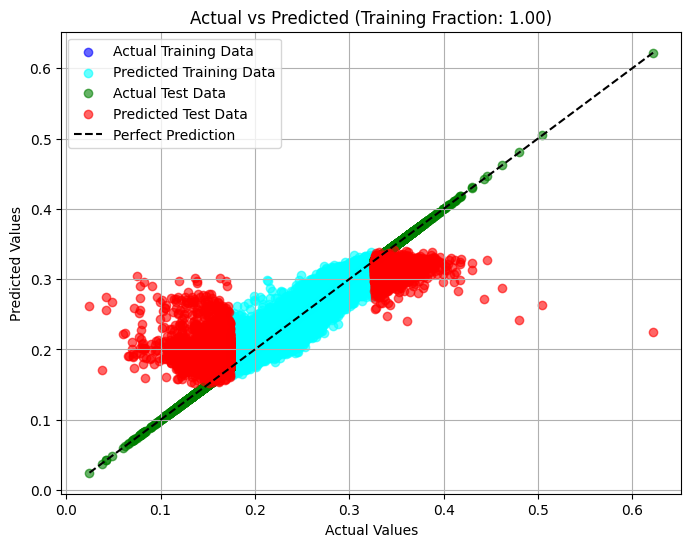

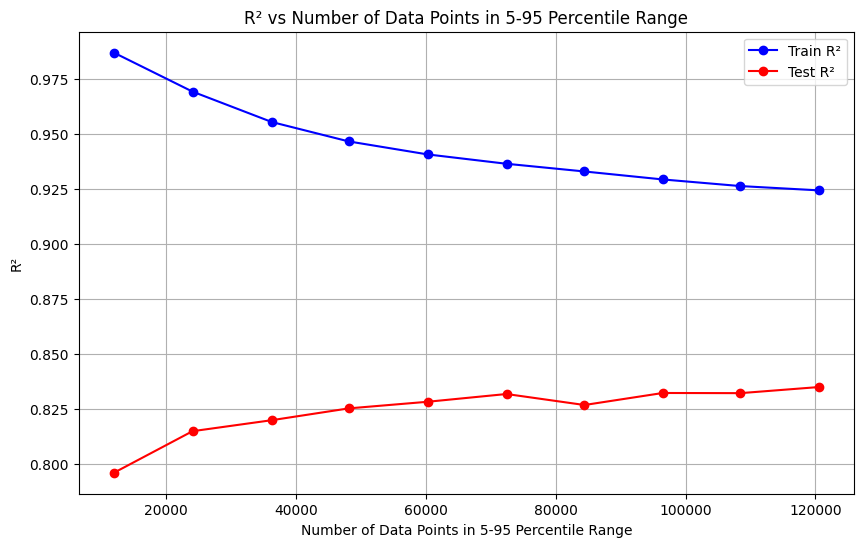

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize the default model
model = XGBRegressor(random_state=42)

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for fraction in fractions:
    # Filter data within the 5-95 percentile range
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)

    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]

    # Train the model
    model.fit(X_train, Y_train)

    # Predict and calculate R^2 scores
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    #plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    #plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R^2 vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


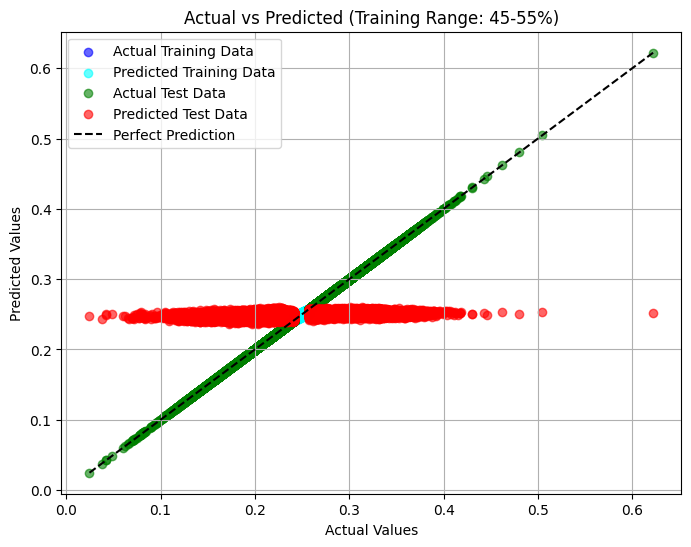

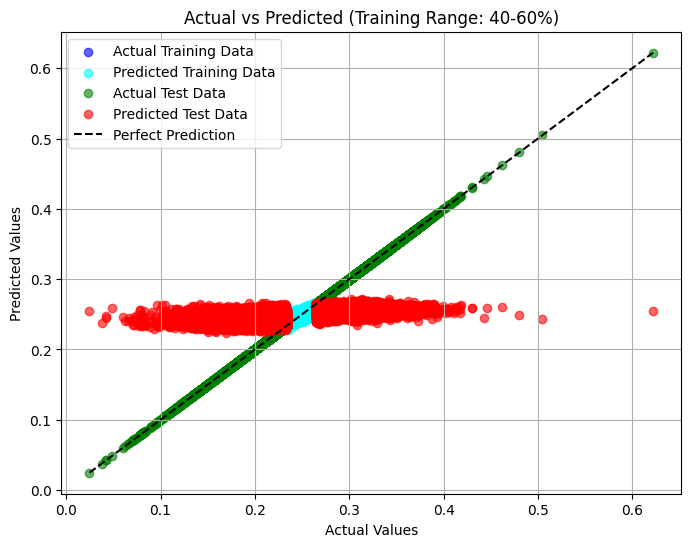

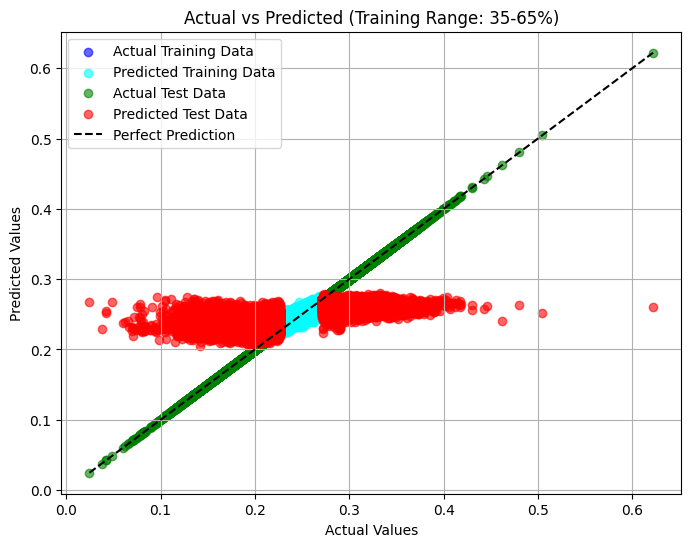

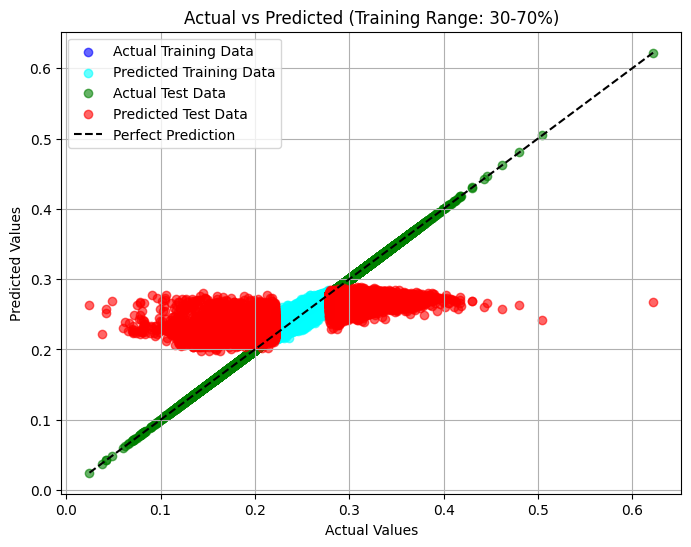

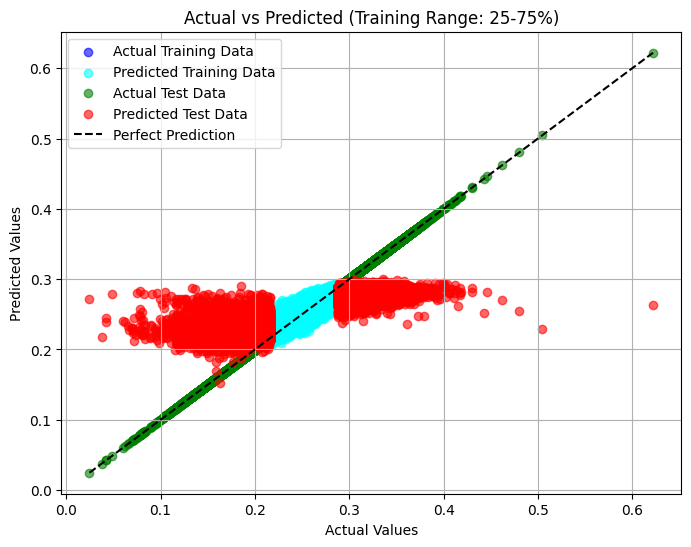

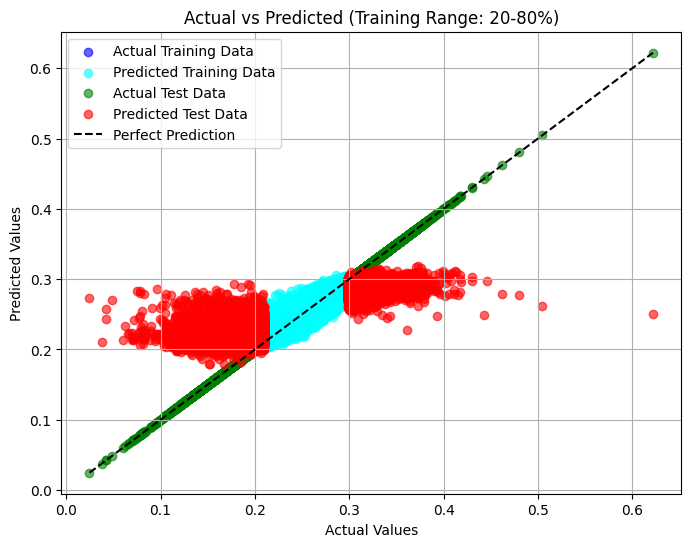

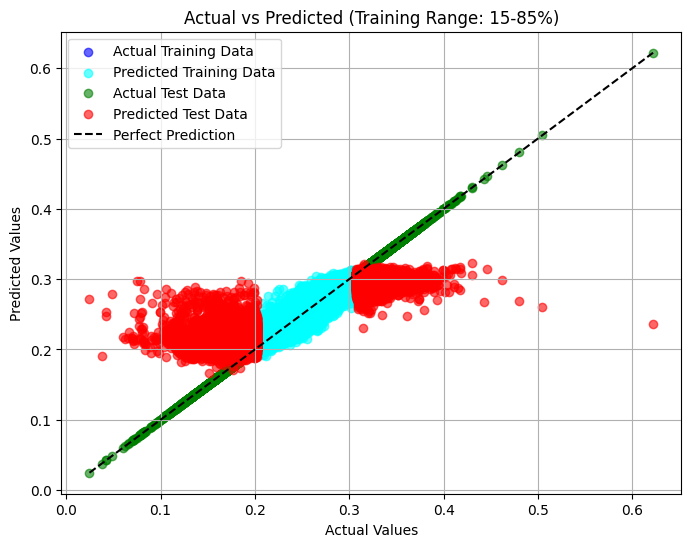

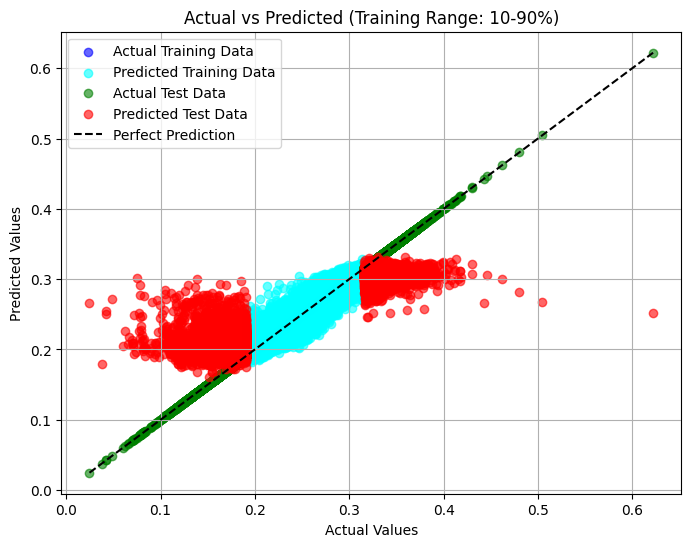

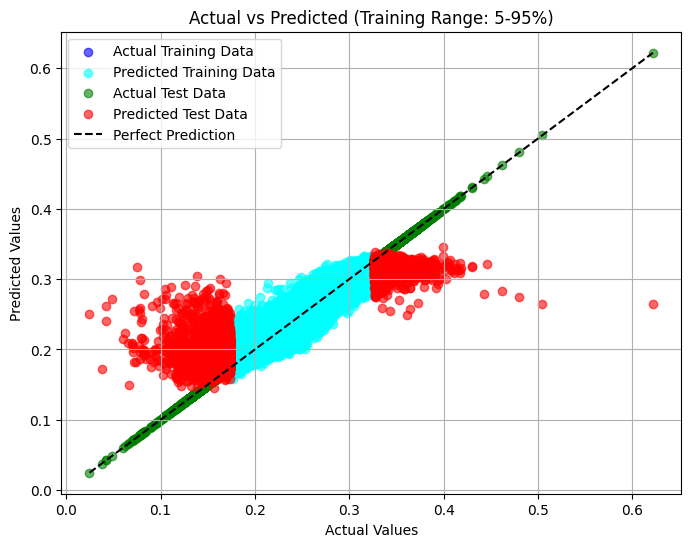

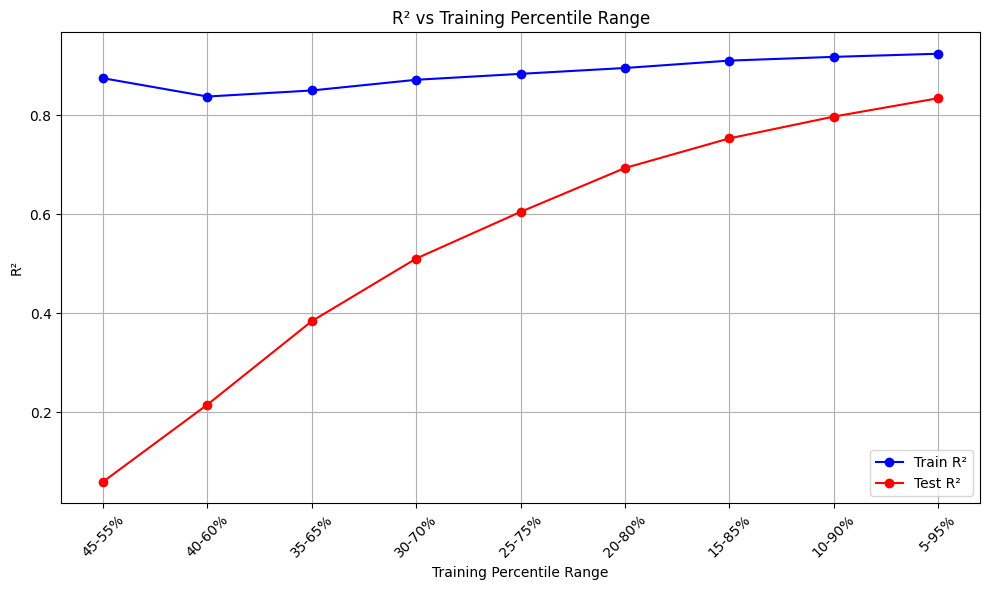

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))
    return torch.stack(features).cpu().numpy()

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Generate ChemBERTa embeddings
smiles = data['SMILES_1'].values
embeddings = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Initialize the XGBoost model
model = XGBRegressor(random_state=42)

# Define percentile ranges
percentile_ranges = [(45, 55), (40, 60), (35, 65), (30, 70), (25, 75), (20, 80), (15, 85), (10, 90), (5, 95)]

# Initialize results
train_r2_scores = []
test_r2_scores = []
range_labels = []

for low, high in percentile_ranges:
    # Compute percentiles
    q_low, q_high = np.percentile(Y, [low, high])
    
    # Create training and testing masks
    train_mask = (Y >= q_low) & (Y <= q_high)
    test_mask = ~train_mask
    
    # Split the data
    X_train, Y_train = X_scaled[train_mask], Y[train_mask]
    X_test, Y_test = X_scaled[test_mask], Y[test_mask]
    
    # Fit the model
    model.fit(X_train, Y_train)
    
    # Predict
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)
    
    # Compute R² scores
    train_r2 = r2_score(Y_train, Y_train_pred)
    test_r2 = r2_score(Y_test, Y_test_pred)
    
    # Store results
    train_r2_scores.append(train_r2)
    test_r2_scores.append(test_r2)
    range_labels.append(f"{low}-{high}%")
    
    # Plot Actual vs Predicted
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Range: {low}-{high}%)")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² scores vs Training Percentile Range
plt.figure(figsize=(10, 6))
plt.plot(range_labels, train_r2_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(range_labels, test_r2_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Training Percentile Range")
plt.xlabel("Training Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


379/379 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


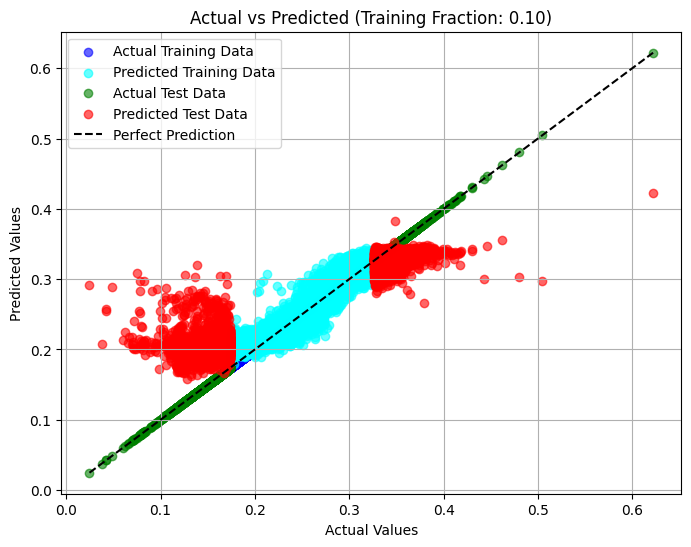

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


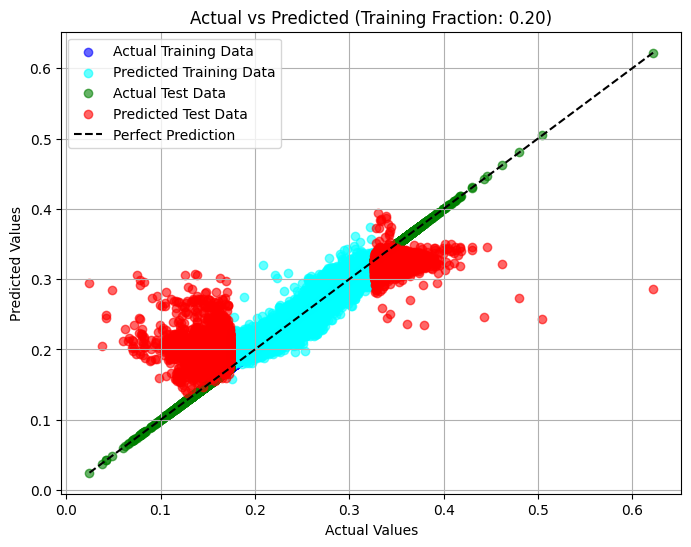

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


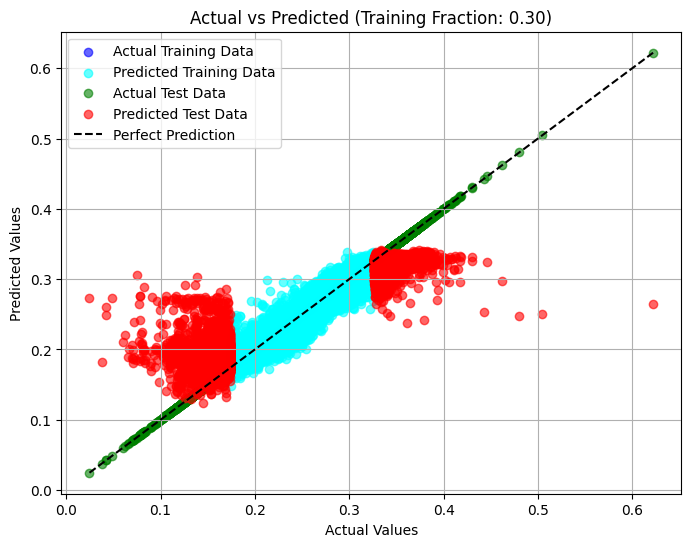

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1499/1499 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


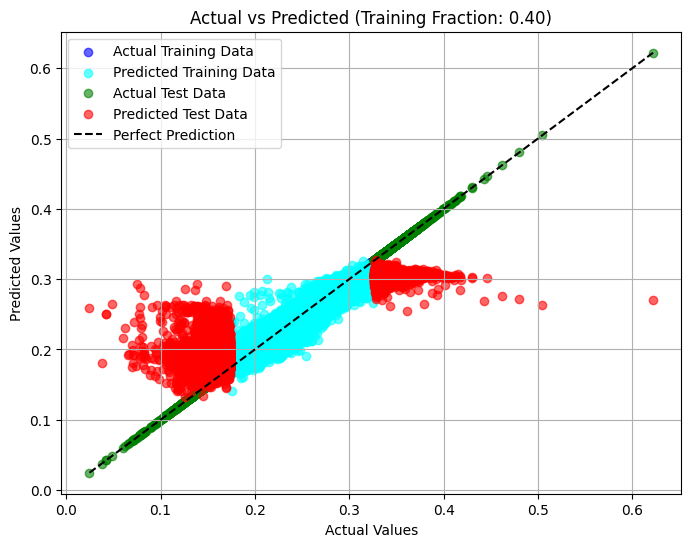

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1884/1884 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


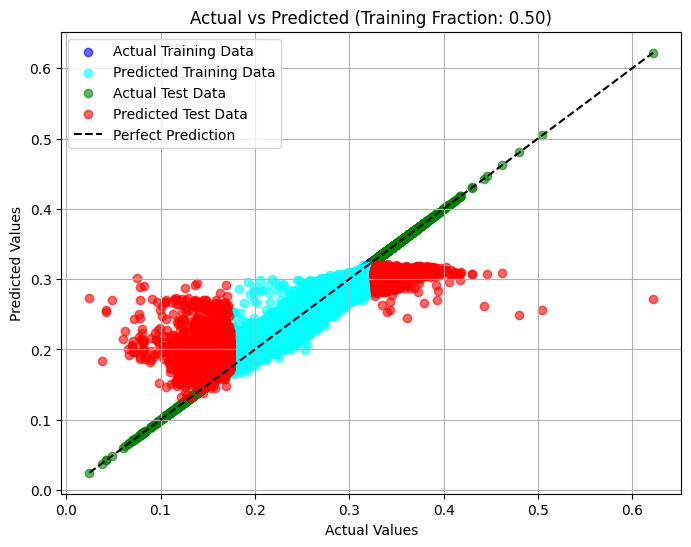

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2261/2261 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


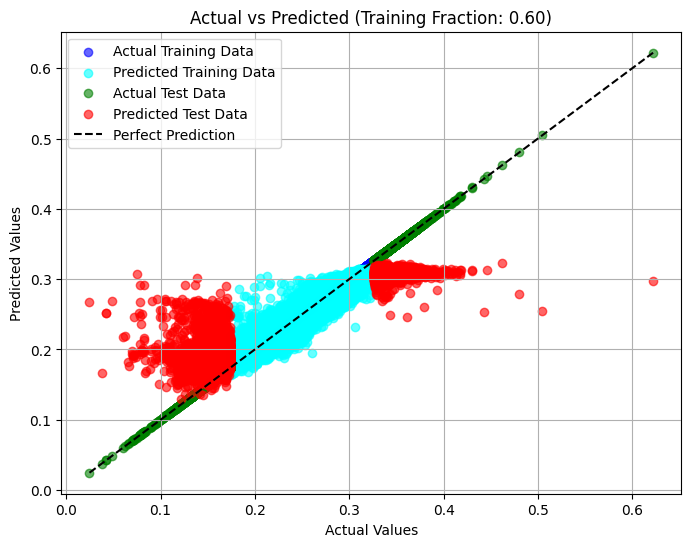

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2631/2631 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


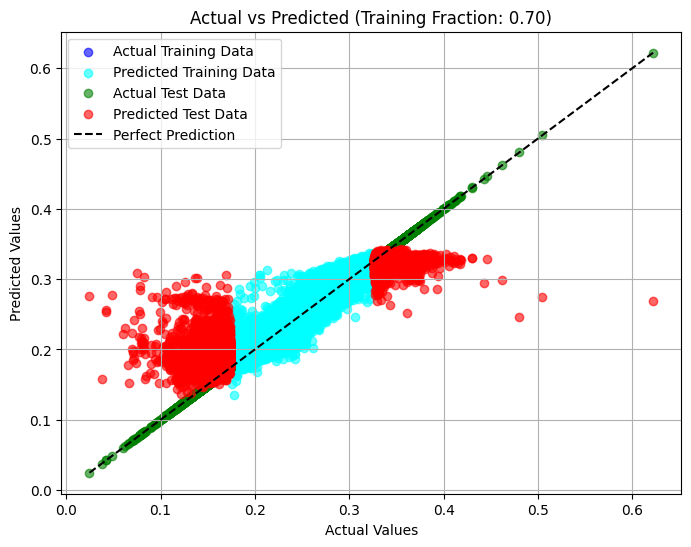

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3012/3012 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


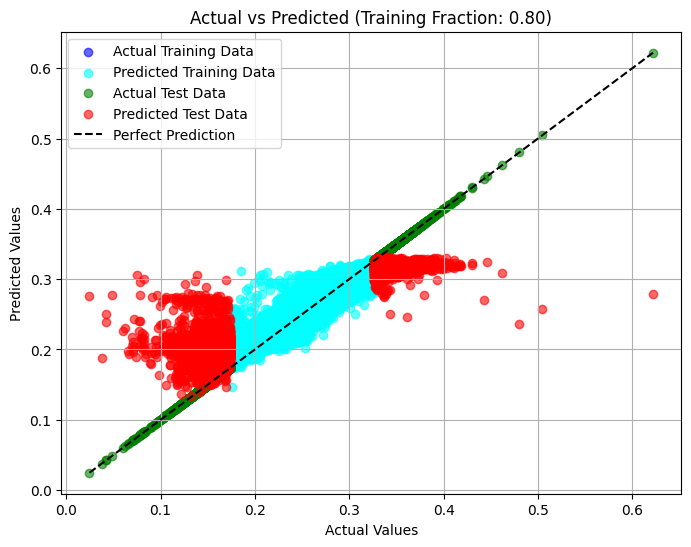

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3391/3391 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


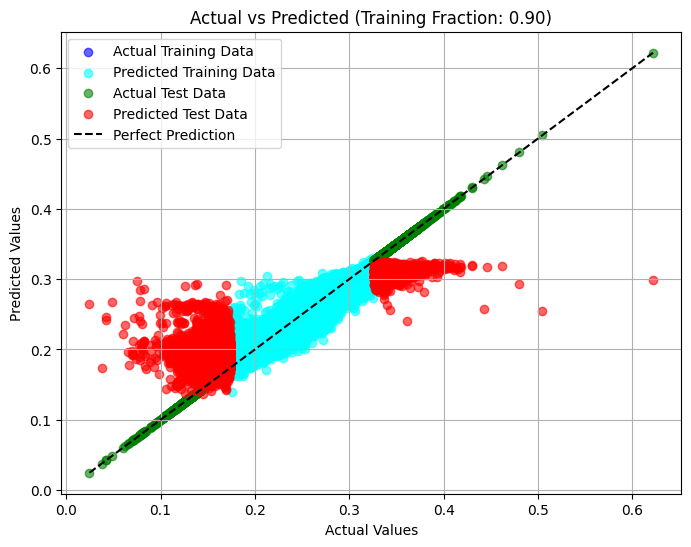

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3765/3765 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


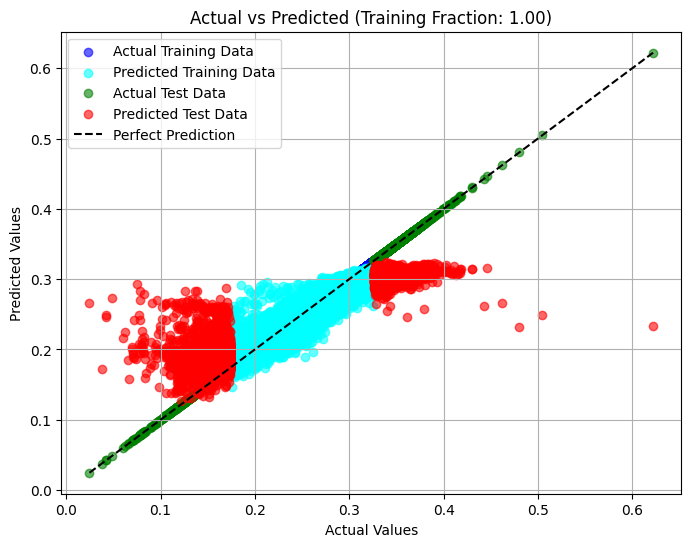

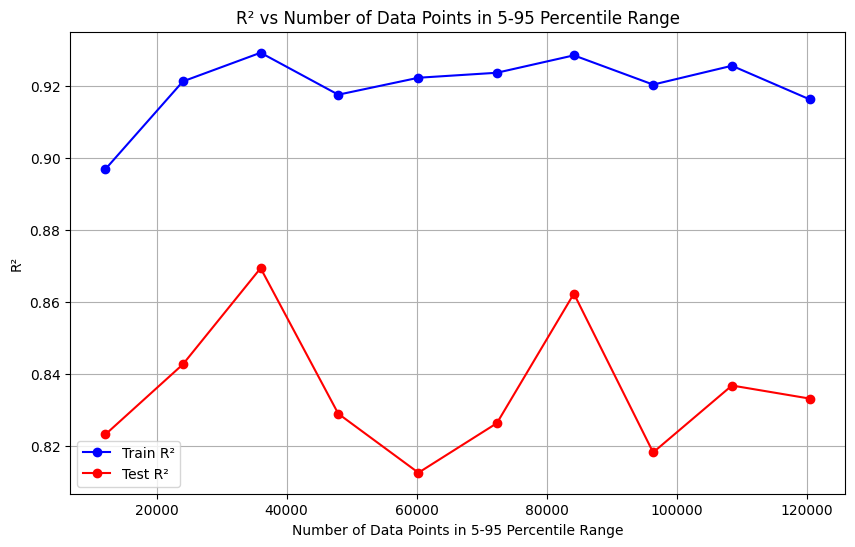

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

# Load the dataset
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            try:
                encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
                output = chemberta_model(**encoded)
                features.append(output.pooler_output.squeeze(0).cpu().numpy())
            except Exception as e:
                print(f"Error processing SMILES: {smiles}. Error: {e}")
                features.append(None)
    return np.array(features)

# Generate ChemBERTa embeddings for the SMILES
print("Generating ChemBERTa embeddings...")
smiles_list = data['SMILES_1'].tolist()
embeddings = featurize_smiles(smiles_list)

# Filter out invalid SMILES
valid_indices = [i for i, emb in enumerate(embeddings) if emb is not None]
embeddings = np.array([embeddings[i] for i in valid_indices])
data = data.iloc[valid_indices]

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for i, fraction in enumerate(fractions):
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)
    
    X_train = X_scaled[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = X_scaled[test_indices]
    Y_test = Y[test_indices]
    
    # Build the DNN model
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)  # Regression output
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=[])
    
    # Train the model
    model.fit(X_train, Y_train, epochs=50, batch_size=32, verbose=0)
    
    # Predict
    Y_train_pred = model.predict(X_train).flatten()
    Y_test_pred = model.predict(X_test).flatten()
    
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))
    
    # Plot actual vs predicted
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


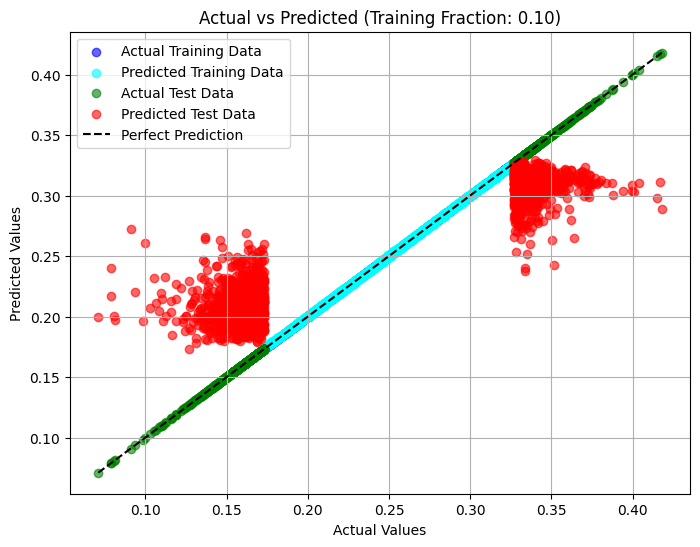

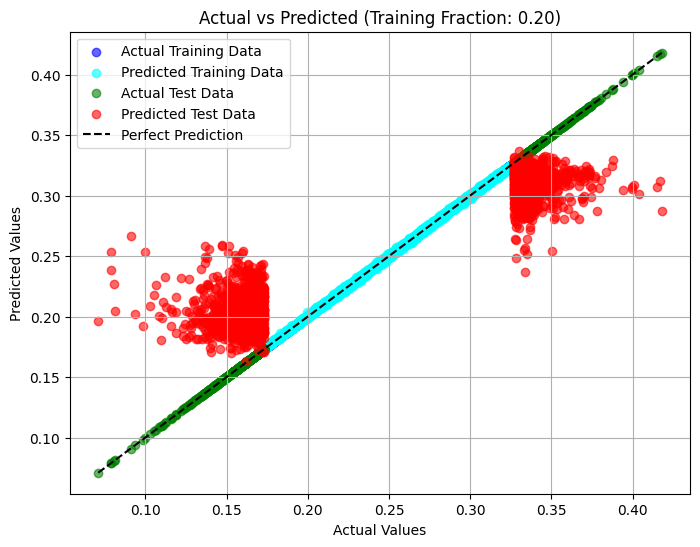

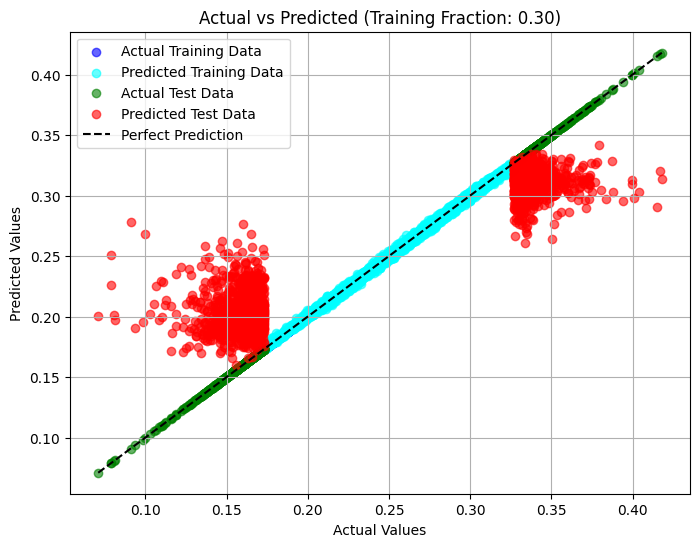

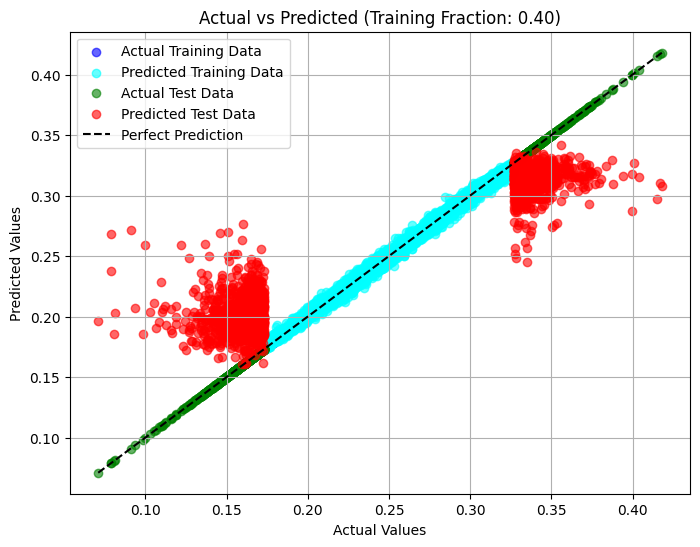

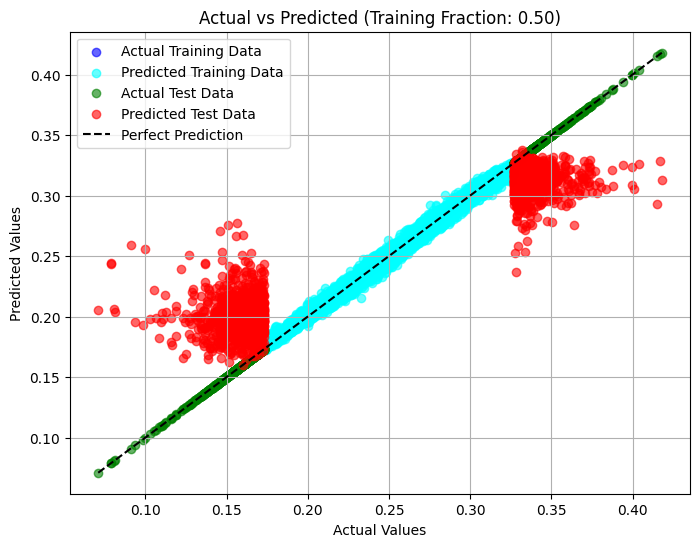

...

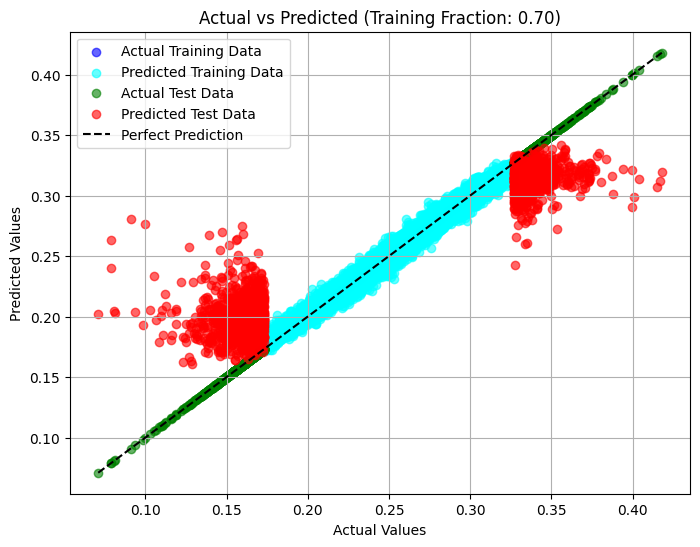

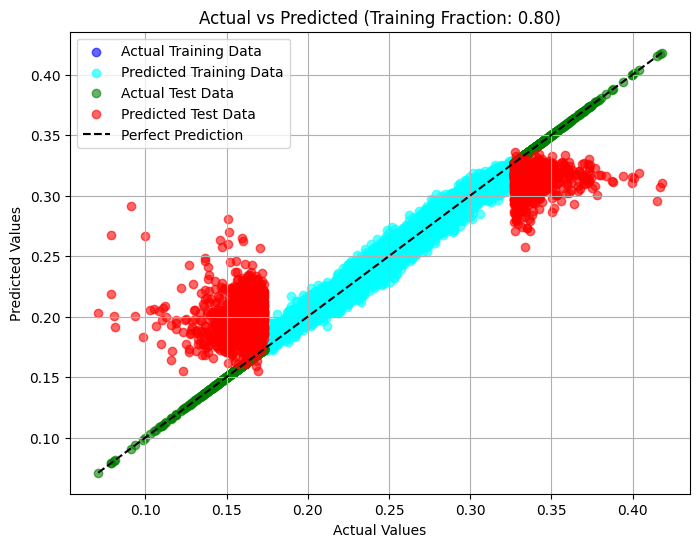

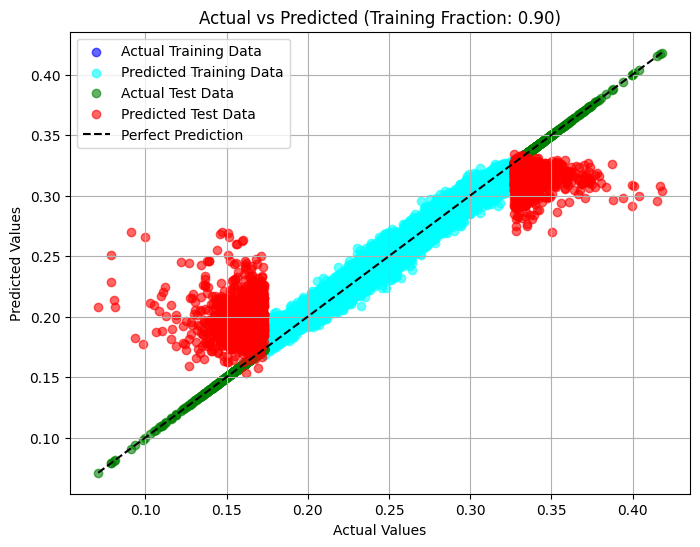

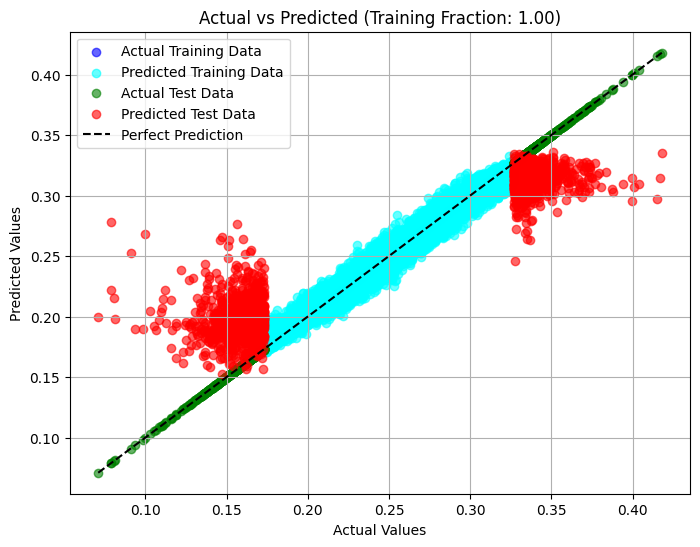

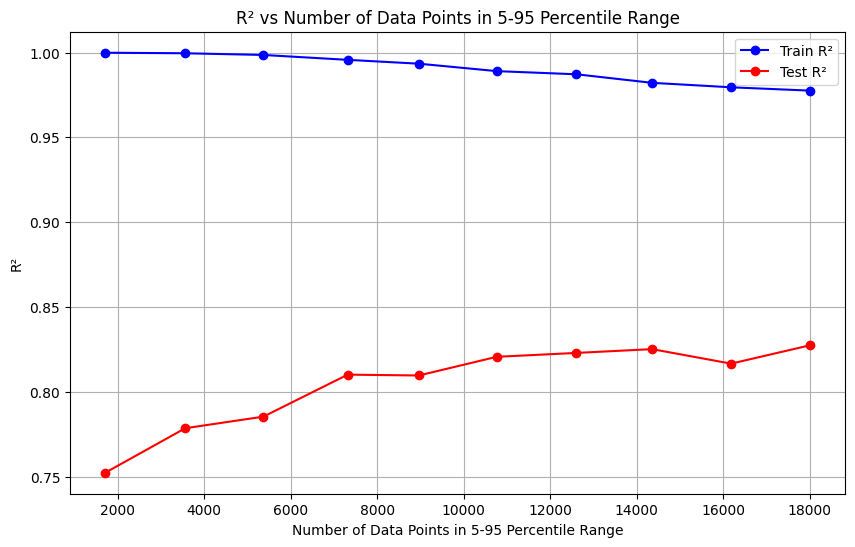

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Load the data
data_path = "/kaggle/input/data20k/Data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize the default model
model = XGBRegressor(random_state=42)

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for fraction in fractions:
    # Filter data within the 5-95 percentile range
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)

    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]

    # Train the model
    model.fit(X_train, Y_train)

    # Predict and calculate R^2 scores
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R^2 vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


378/378 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


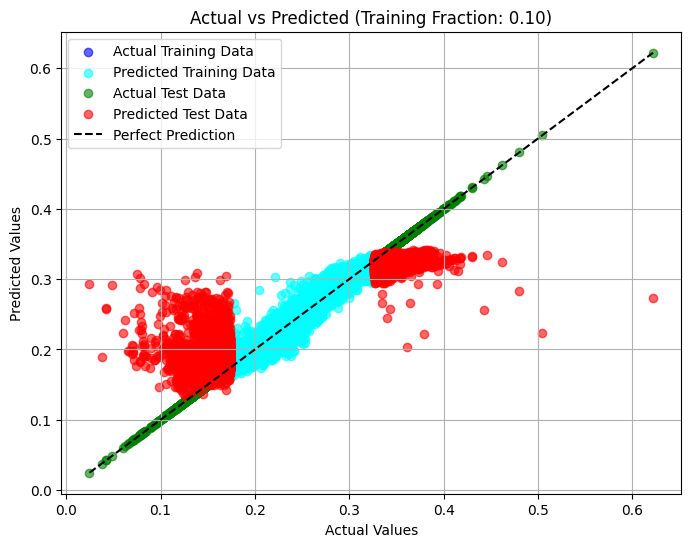

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


758/758 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


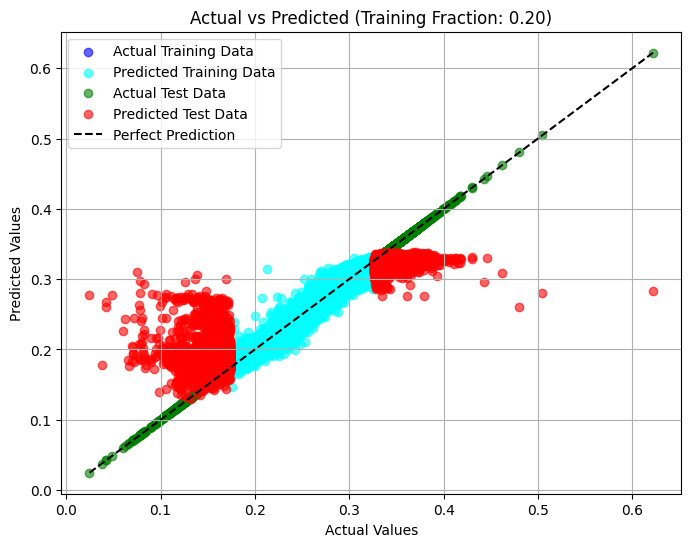

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1137/1137 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


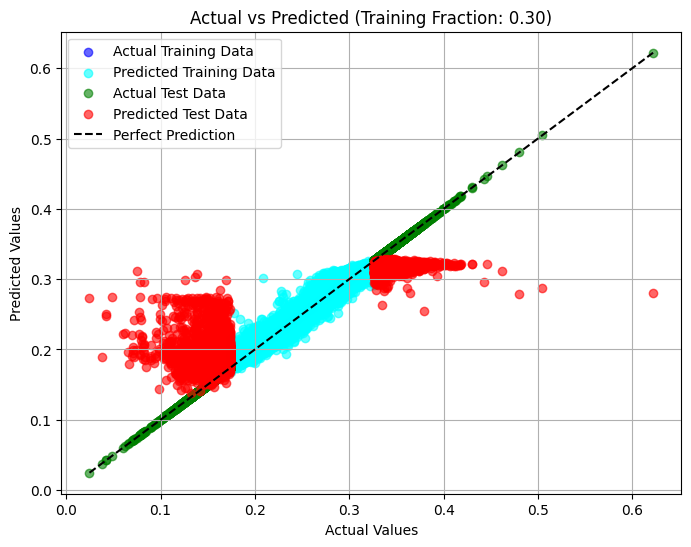

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1509/1509 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


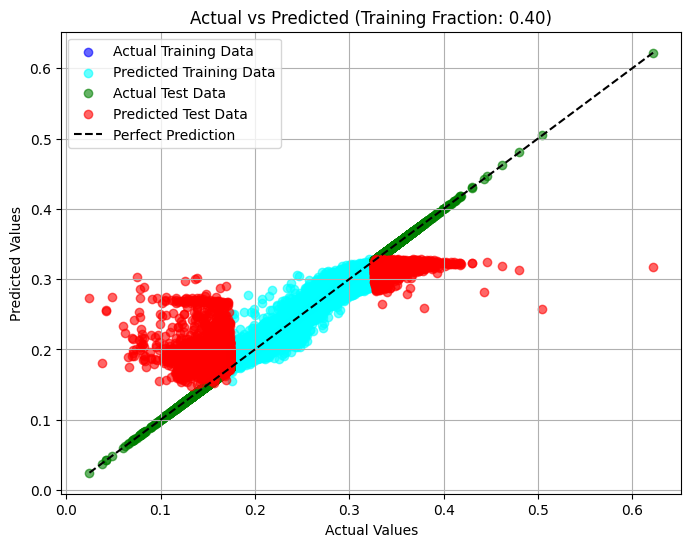

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1887/1887 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


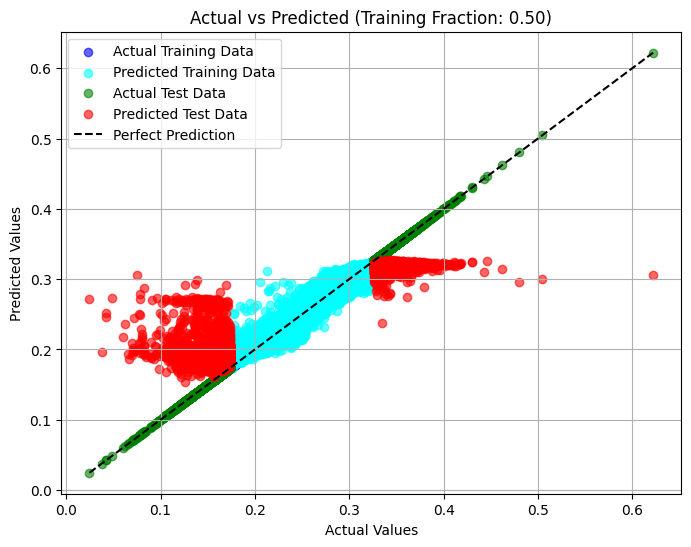

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2258/2258 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


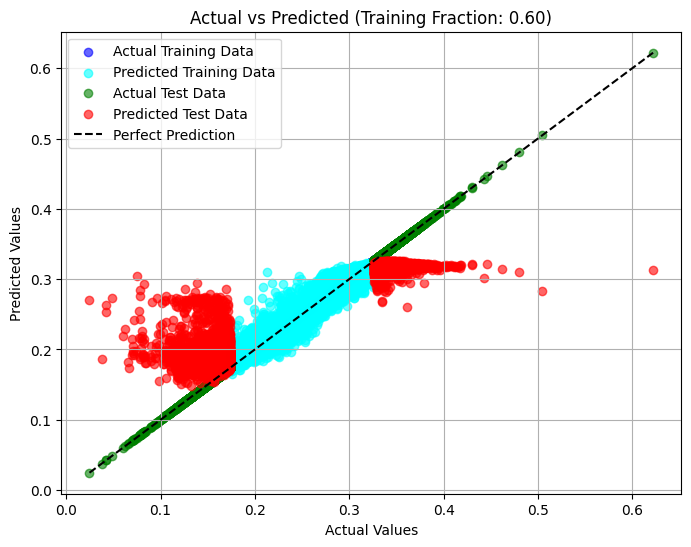

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2631/2631 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


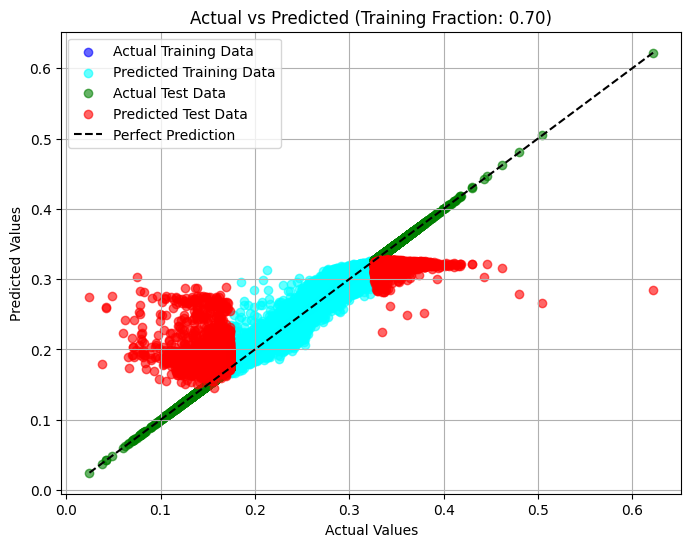

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3017/3017 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


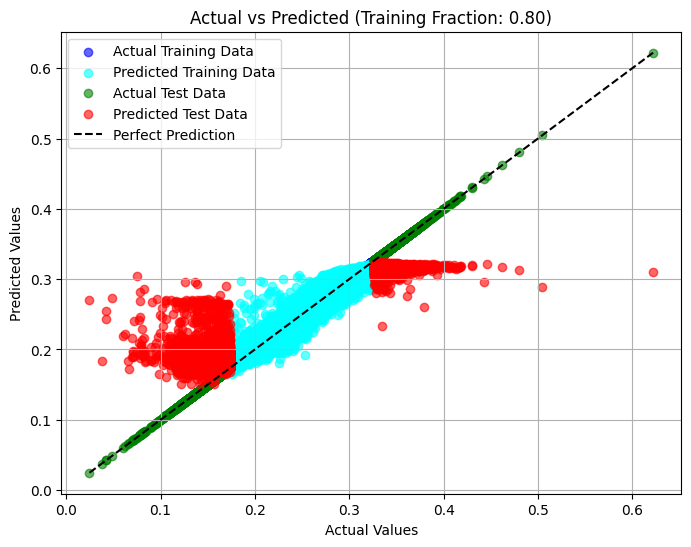

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3390/3390 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


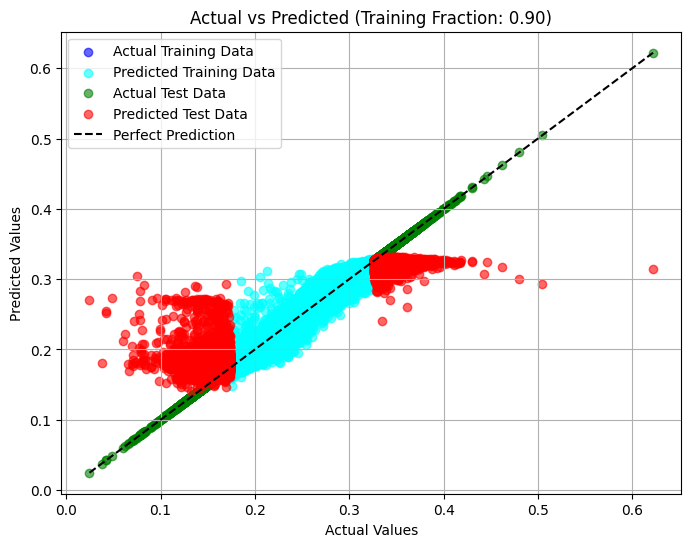

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3765/3765 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
419/419 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


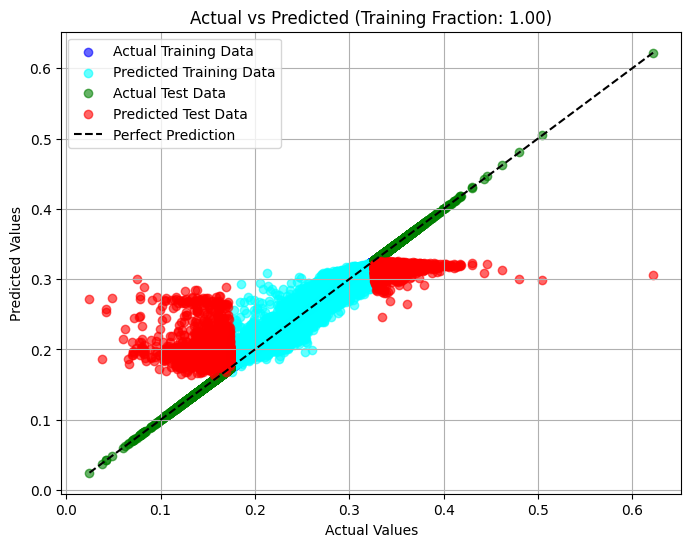

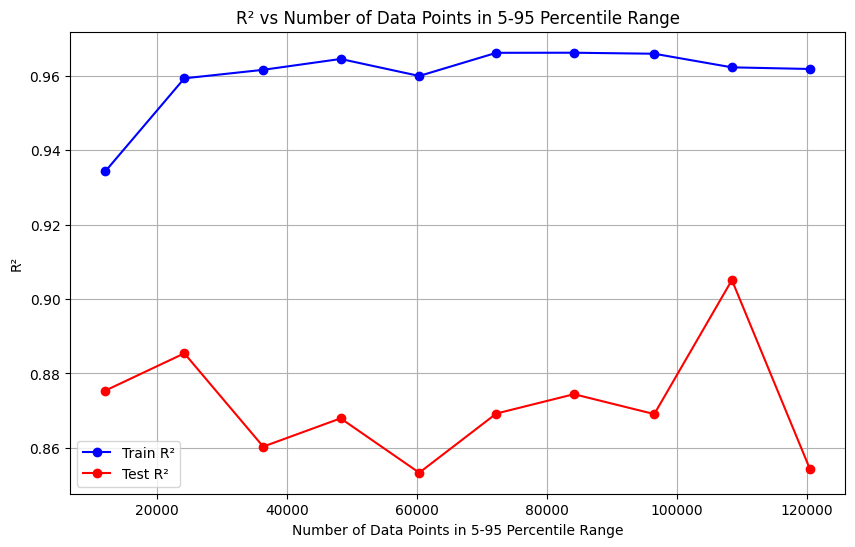

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

# Load the dataset
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            try:
                encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
                output = chemberta_model(**encoded)
                features.append(output.pooler_output.squeeze(0).cpu().numpy())
            except Exception as e:
                print(f"Error processing SMILES: {smiles}. Error: {e}")
                features.append(None)
    return np.array(features)

# Generate ChemBERTa embeddings for the SMILES
print("Generating ChemBERTa embeddings...")
smiles_list = data['SMILES_1'].tolist()
embeddings = featurize_smiles(smiles_list)

# Filter out invalid SMILES
valid_indices = [i for i, emb in enumerate(embeddings) if emb is not None]
embeddings = np.array([embeddings[i] for i in valid_indices])
data = data.iloc[valid_indices]

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for i, fraction in enumerate(fractions):
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)
    
    X_train = X_scaled[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = X_scaled[test_indices]
    Y_test = Y[test_indices]
    
    # Build the advanced DNN model
    model = Sequential([
        Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
        BatchNormalization(),
        Dropout(0.3),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.2),
        Dense(1)  # Regression output
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=[])
    
    # Train the model
    model.fit(X_train, Y_train, epochs=100, batch_size=64, verbose=0)
    
    # Predict
    Y_train_pred = model.predict(X_train).flatten()
    Y_test_pred = model.predict(X_test).flatten()
    
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))
    
    # Plot actual vs predicted
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


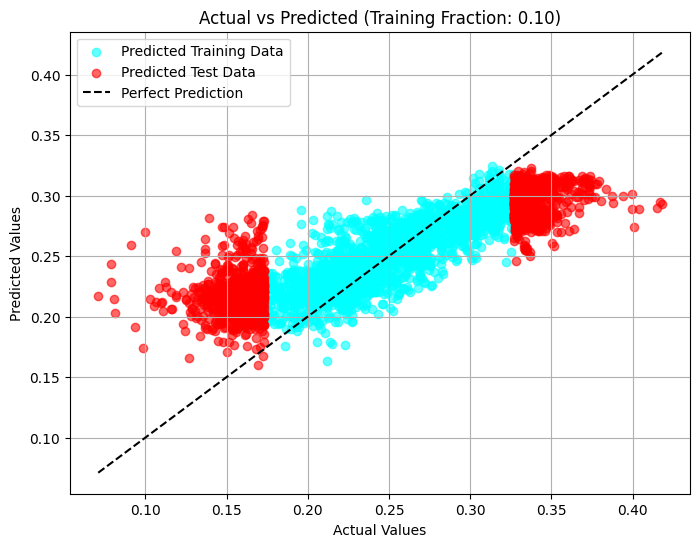

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


112/112 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


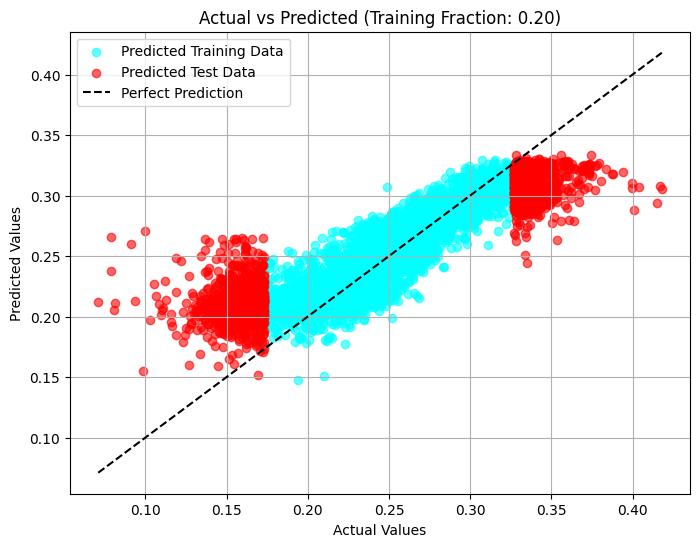

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


171/171 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


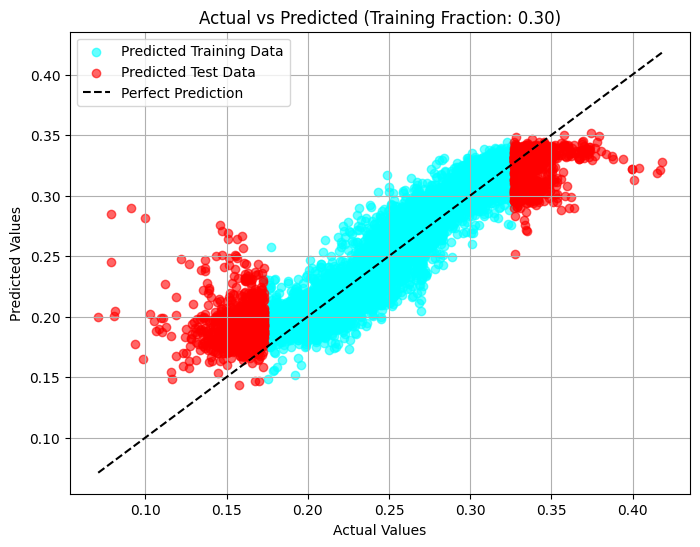

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


227/227 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


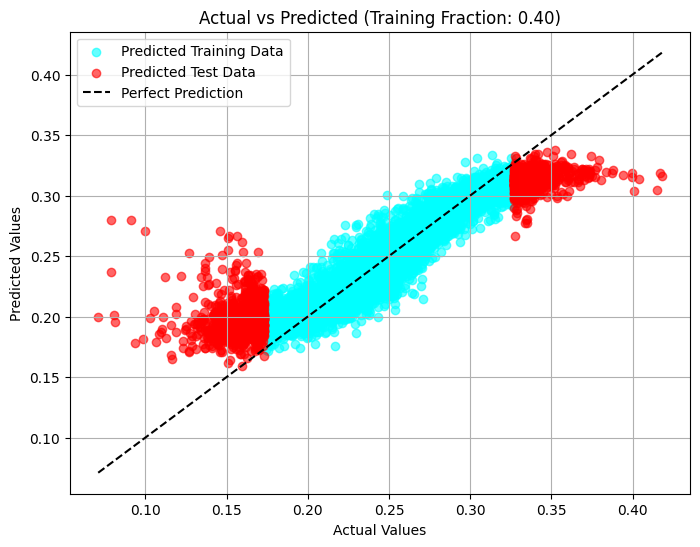

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


285/285 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


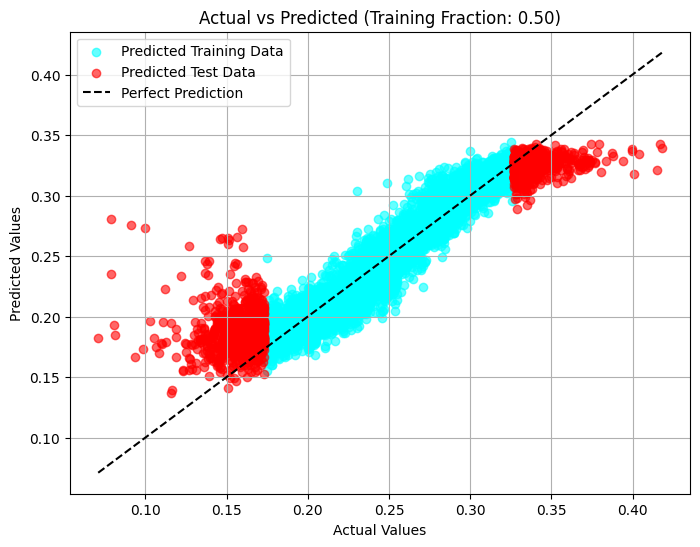

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


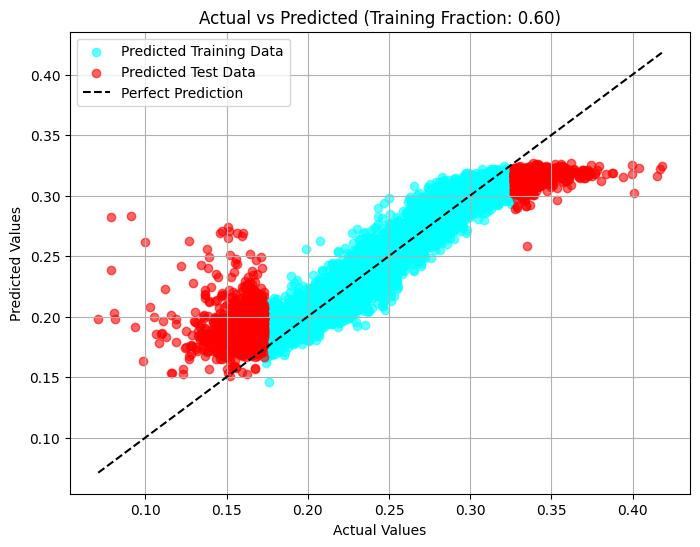

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


394/394 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


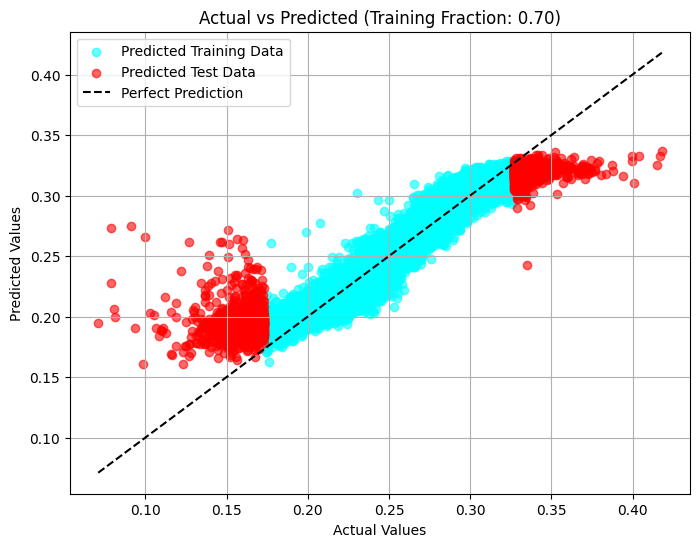

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


451/451 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


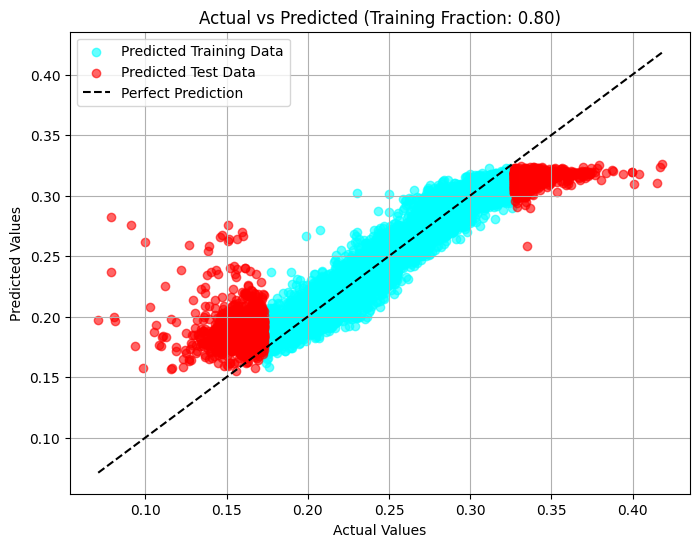

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


507/507 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


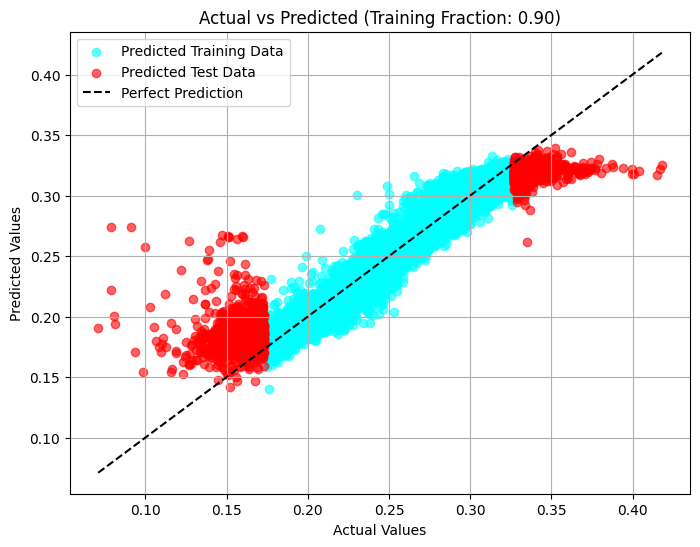

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


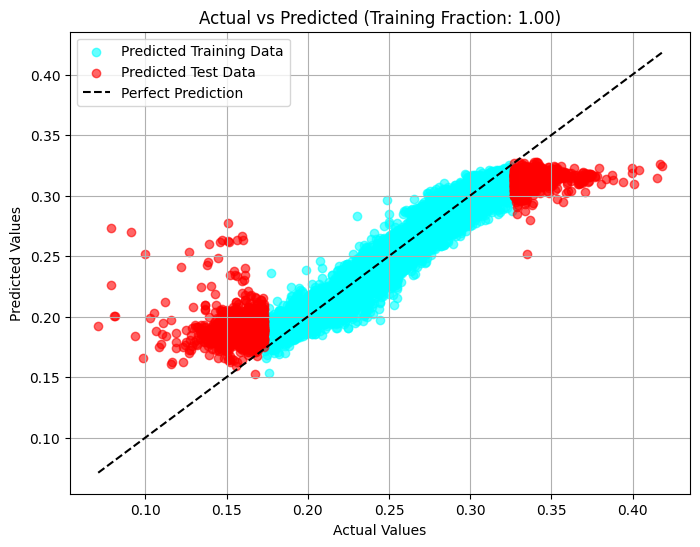

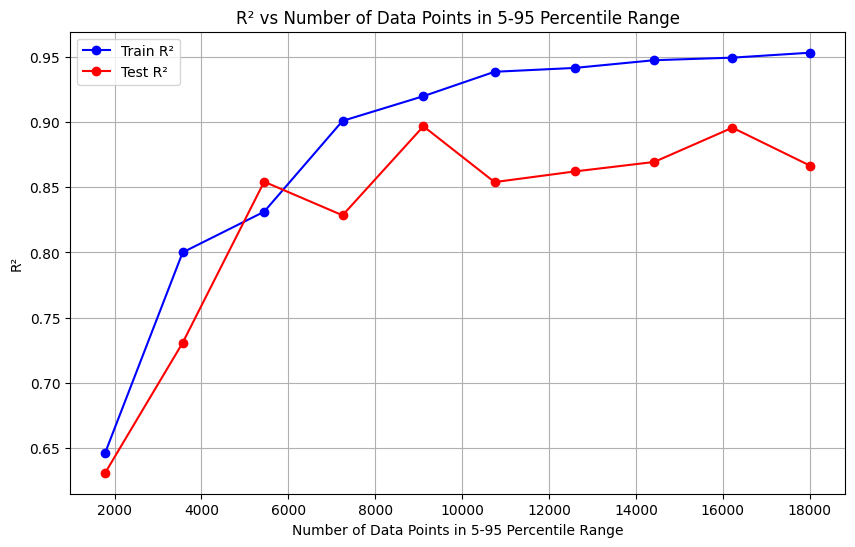

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

# Load the dataset
data_path = "/kaggle/input/data20k/Data.xlsx"
data = pd.read_excel(data_path)

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            try:
                encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
                output = chemberta_model(**encoded)
                features.append(output.pooler_output.squeeze(0).cpu().numpy())
            except Exception as e:
                print(f"Error processing SMILES: {smiles}. Error: {e}")
                features.append(None)
    return np.array(features)

# Generate ChemBERTa embeddings for the SMILES
print("Generating ChemBERTa embeddings...")
smiles_list = data['SMILES_1'].tolist()
embeddings = featurize_smiles(smiles_list)

# Filter out invalid SMILES
valid_indices = [i for i, emb in enumerate(embeddings) if emb is not None]
embeddings = np.array([embeddings[i] for i in valid_indices])
data = data.iloc[valid_indices]

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for i, fraction in enumerate(fractions):
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)
    
    X_train = X_scaled[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = X_scaled[test_indices]
    Y_test = Y[test_indices]
    
    # Build the advanced DNN model
    model = Sequential([
        Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
        BatchNormalization(),
        Dropout(0.3),
        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.2),
        Dense(1)  # Regression output
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=[])
    
    # Train the model
    model.fit(X_train, Y_train, epochs=100, batch_size=64, verbose=0)
    
    # Predict
    Y_train_pred = model.predict(X_train).flatten()
    Y_test_pred = model.predict(X_test).flatten()
    
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))
    
    # Plot actual vs predicted
    plt.figure(figsize=(8, 6))
    #plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    #plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


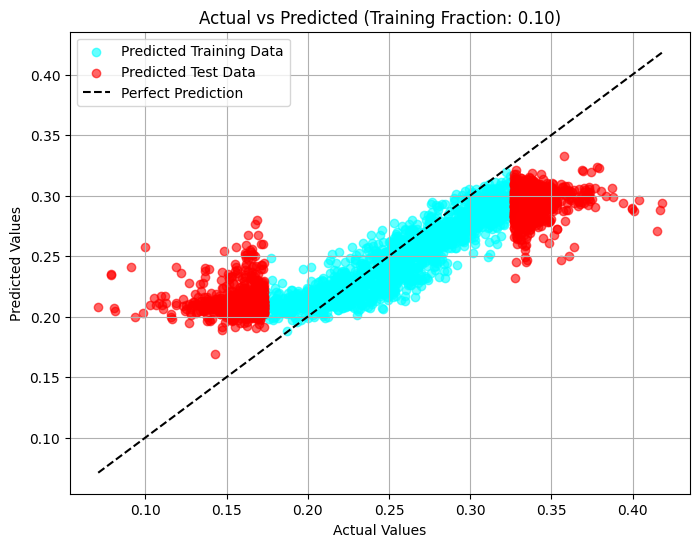

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


112/112 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


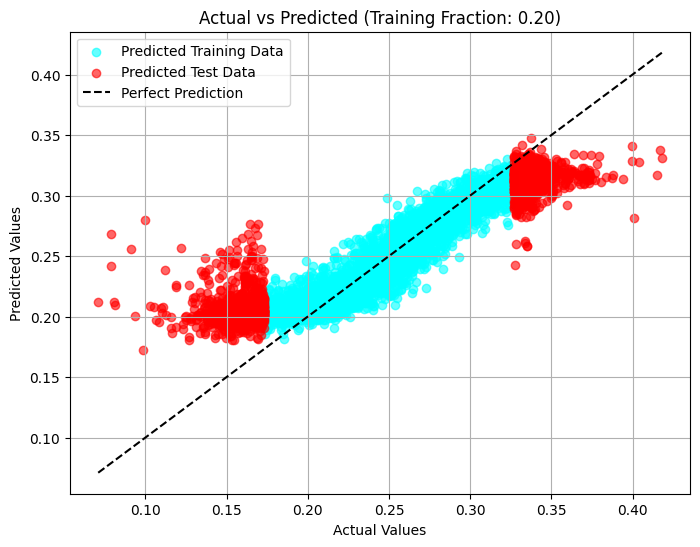

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


167/167 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


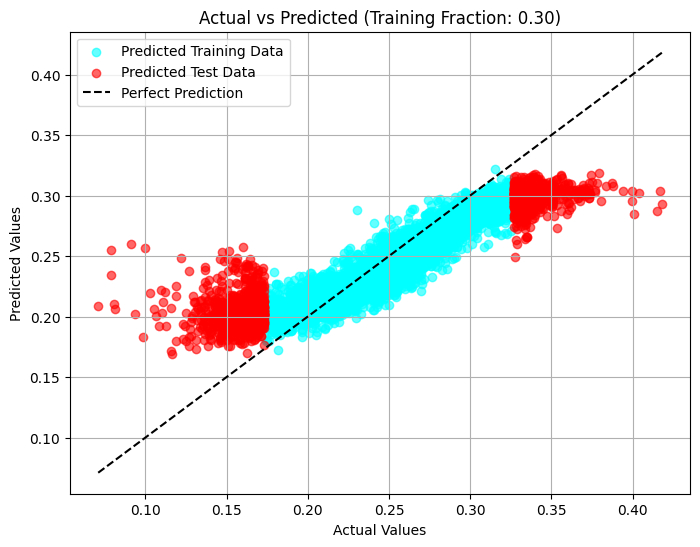

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


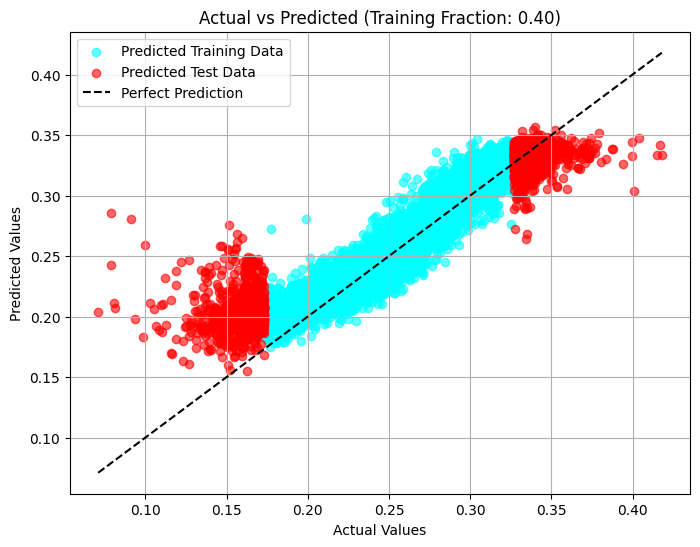

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


281/281 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


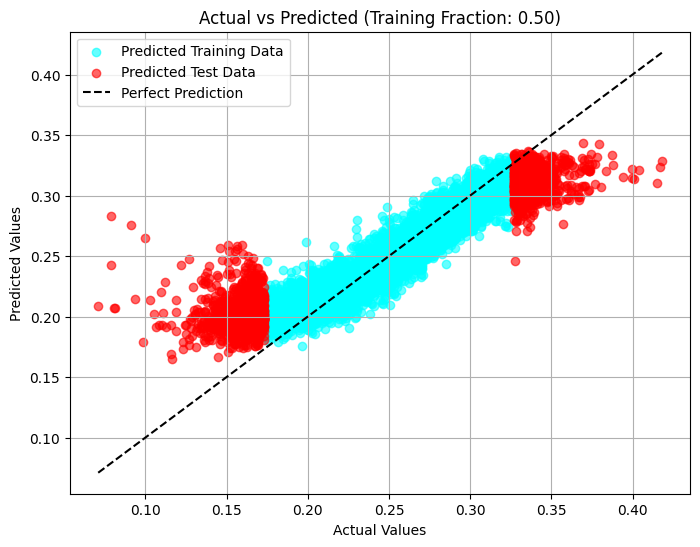

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


337/337 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


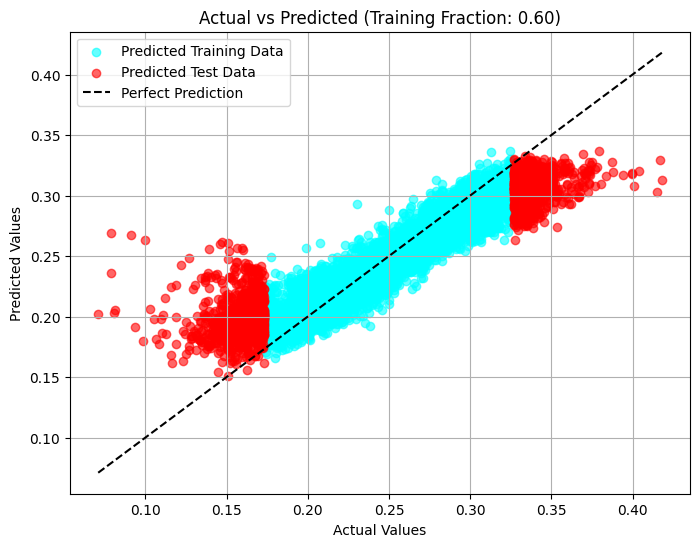

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


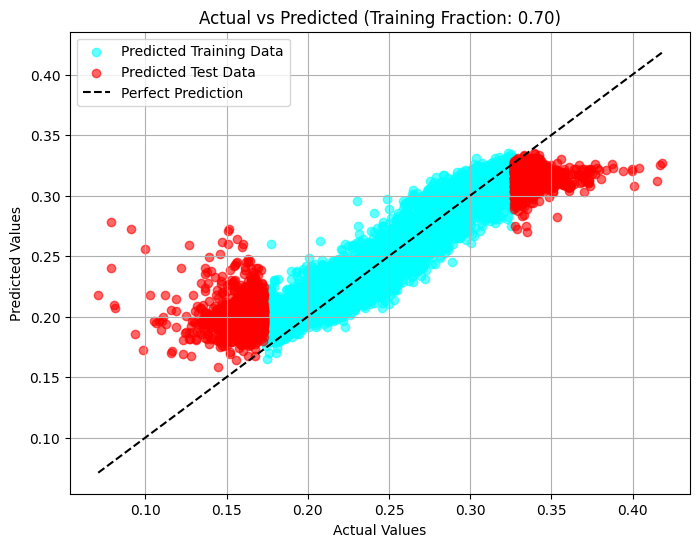

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


452/452 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


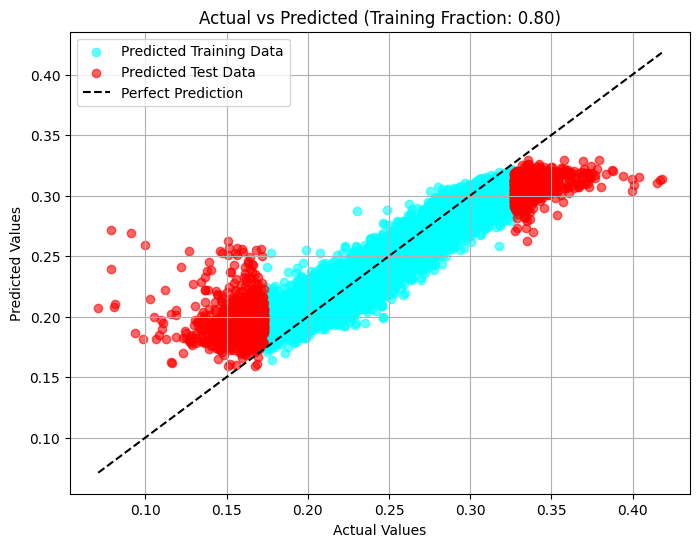

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


508/508 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


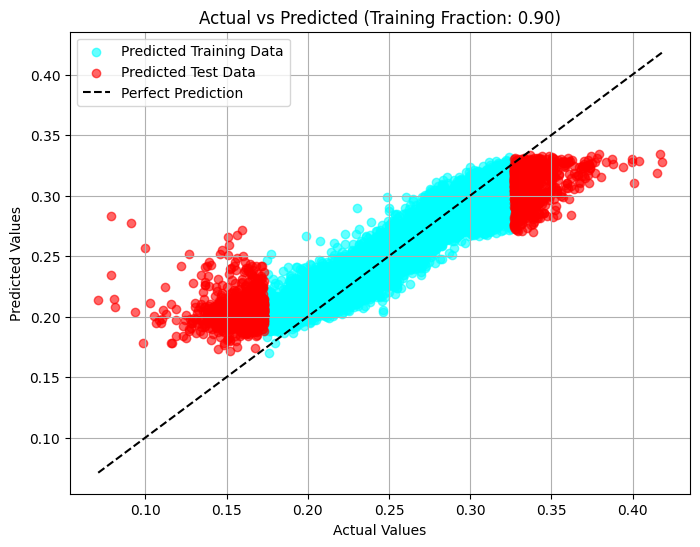

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


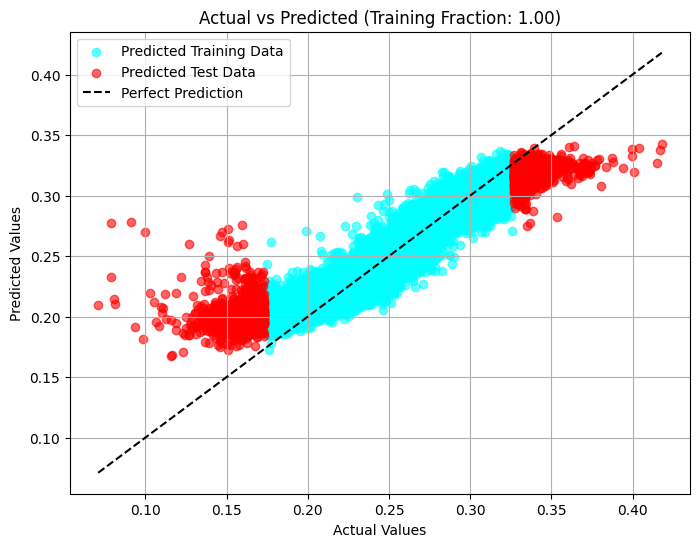

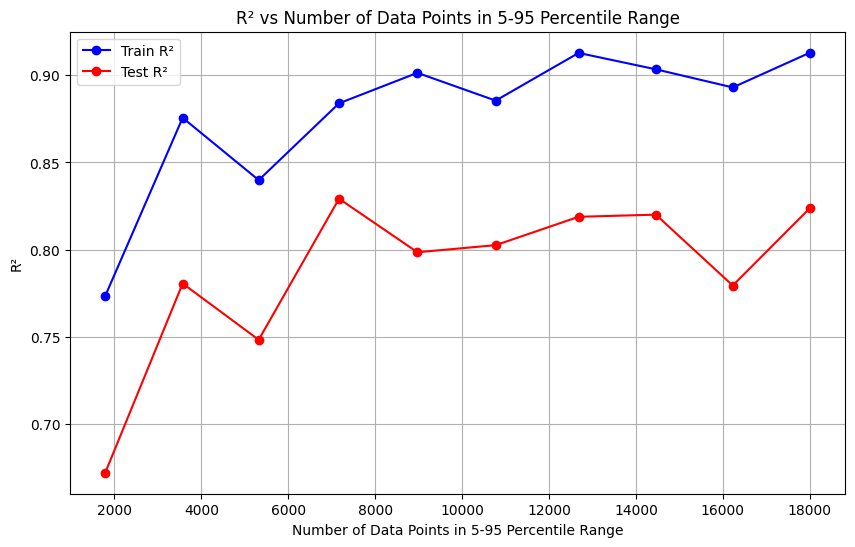

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

# Load the dataset
data_path = "/kaggle/input/data20k/Data.xlsx"
data = pd.read_excel(data_path)

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            try:
                encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
                output = chemberta_model(**encoded)
                features.append(output.pooler_output.squeeze(0).cpu().numpy())
            except Exception as e:
                print(f"Error processing SMILES: {smiles}. Error: {e}")
                features.append(None)
    return np.array(features)

# Generate ChemBERTa embeddings for the SMILES
print("Generating ChemBERTa embeddings...")
smiles_list = data['SMILES_1'].tolist()
embeddings = featurize_smiles(smiles_list)

# Filter out invalid SMILES
valid_indices = [i for i, emb in enumerate(embeddings) if emb is not None]
embeddings = np.array([embeddings[i] for i in valid_indices])
data = data.iloc[valid_indices]

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for i, fraction in enumerate(fractions):
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)
    
    X_train = X_scaled[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = X_scaled[test_indices]
    Y_test = Y[test_indices]
    
    # Build the DNN model
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)  # Regression output
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=[])
    
    # Train the model
    model.fit(X_train, Y_train, epochs=50, batch_size=32, verbose=0)
    
    # Predict
    Y_train_pred = model.predict(X_train).flatten()
    Y_test_pred = model.predict(X_test).flatten()
    
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))
    
    # Plot actual vs predicted
    plt.figure(figsize=(8, 6))
   # plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
   # plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()

tokenizer_config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/420 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/14.0M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...


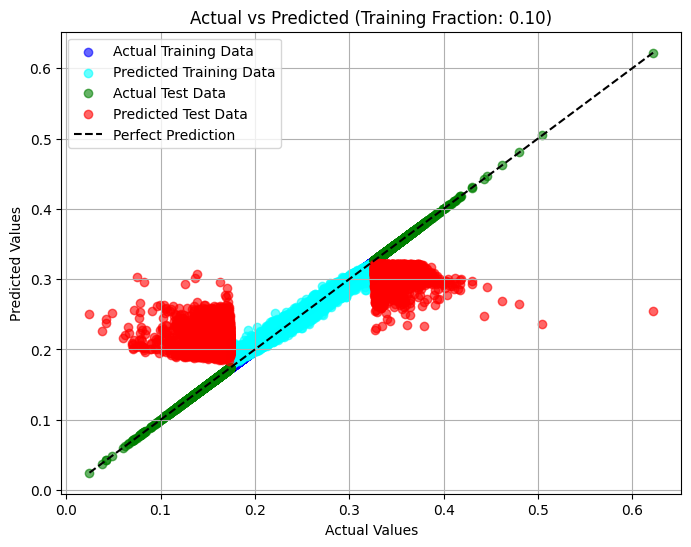

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-1-9b03610ca3a9>", line 80, in <cell line: 66>
    model.fit(X_train, Y_train)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py", line 473, in fit
    trees = Parallel(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 63, in __call__
    return super().__call__(iterable_with_config)
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1918, in __call__
    return output if self.return_generator else list(output)
  File "/usr/local/lib/python3.10/dist-packages/joblib/parallel.py", line 1847, in _get_sequential_output
    res = func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/parallel.py", line 123, in __call__
    return self.function(*args, **kwargs)
  File "/

TypeError: object of type 'NoneType' has no len()

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor

# Load the dataset
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            try:
                encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
                output = chemberta_model(**encoded)
                features.append(output.pooler_output.squeeze(0).cpu().numpy())
            except Exception as e:
                print(f"Error processing SMILES: {smiles}. Error: {e}")
                features.append(None)
    return np.array(features)

# Generate ChemBERTa embeddings for the SMILES
print("Generating ChemBERTa embeddings...")
smiles_list = data['SMILES_1'].tolist()
embeddings = featurize_smiles(smiles_list)

# Filter out invalid SMILES
valid_indices = [i for i, emb in enumerate(embeddings) if emb is not None]
embeddings = np.array([embeddings[i] for i in valid_indices])
data = data.iloc[valid_indices]

# Select the target property
target = 'gap'
Y = data[target].values

# Normalize embeddings
scaler = StandardScaler()
X_scaled = scaler.fit_transform(embeddings)

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for i, fraction in enumerate(fractions):
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)
    
    X_train = X_scaled[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = X_scaled[test_indices]
    Y_test = Y[test_indices]
    
    # Build the Random Forest Regressor model
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    
    # Train the model
    model.fit(X_train, Y_train)
    
    # Predict
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)
    
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))
    
    # Plot actual vs predicted
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train, color='blue', alpha=0.6, label='Actual Training Data')
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test, color='green', alpha=0.6, label='Actual Test Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


In [3]:
pip install rdkit-pypi


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 63.2 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Generating ChemBERTa embeddings...
Generating Morgan fingerprints...


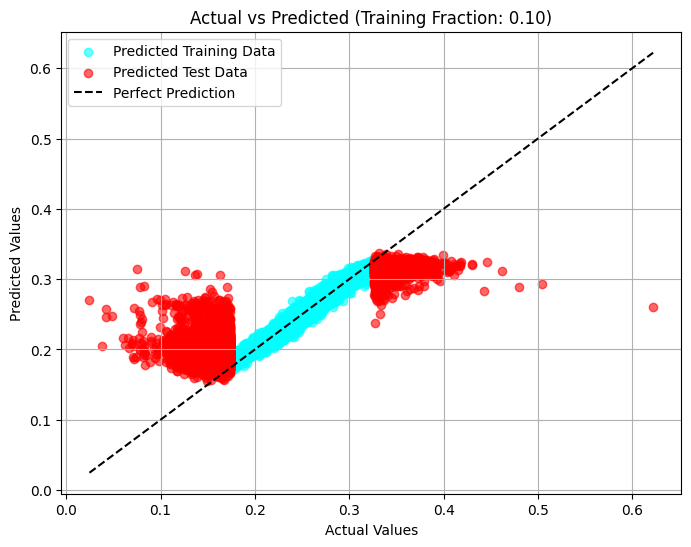

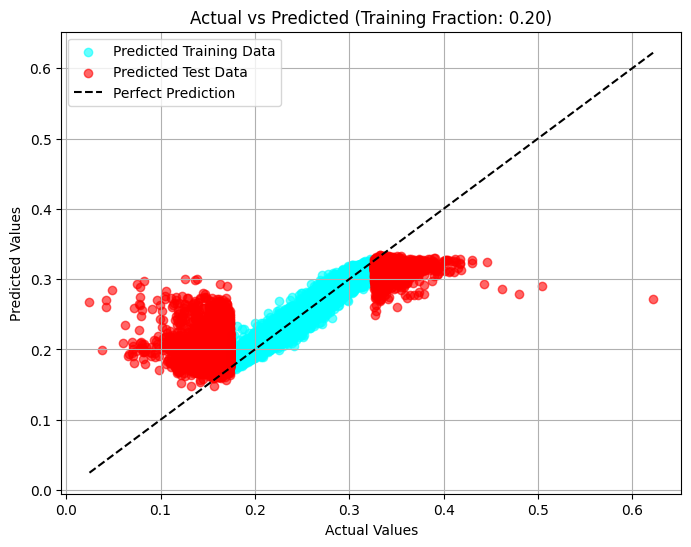

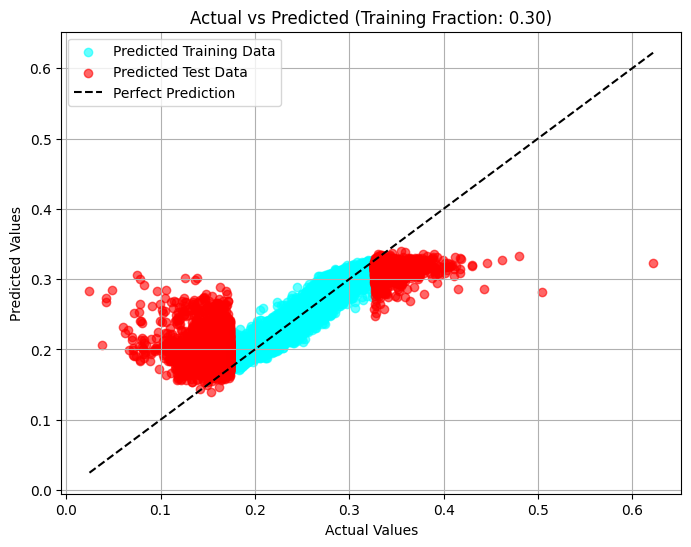

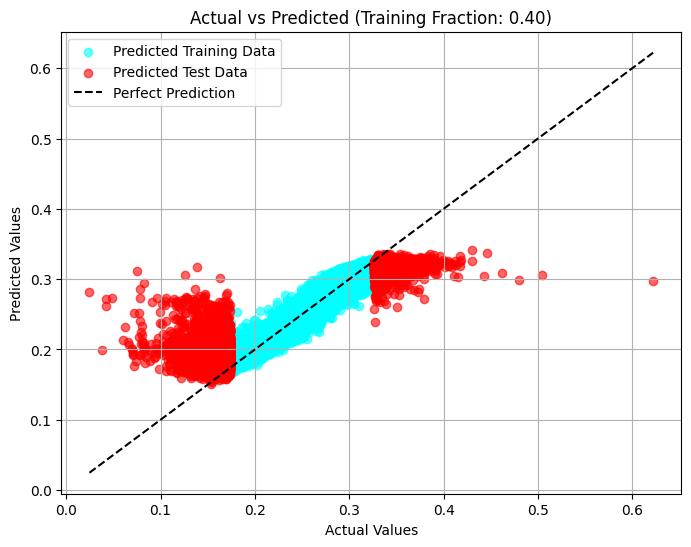

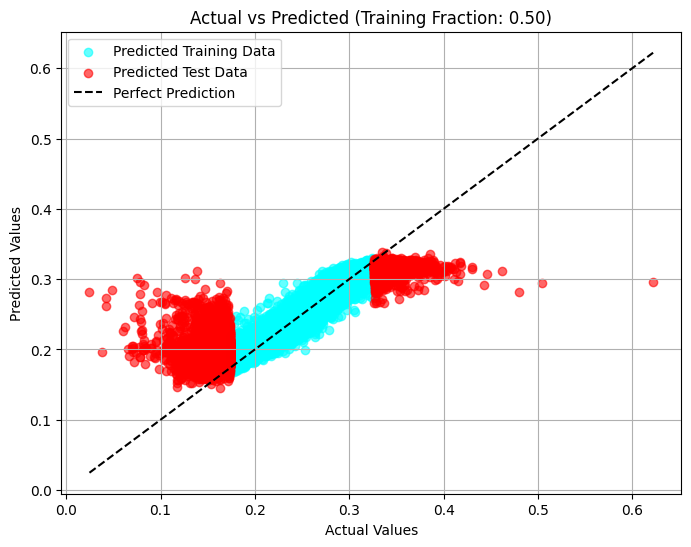

...

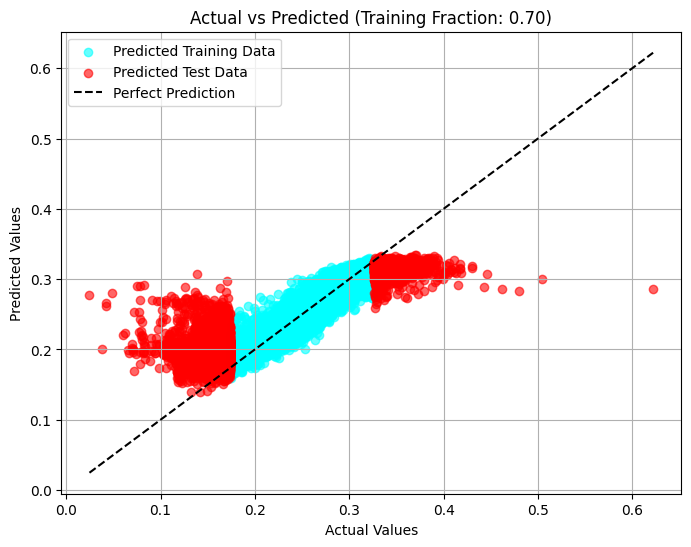

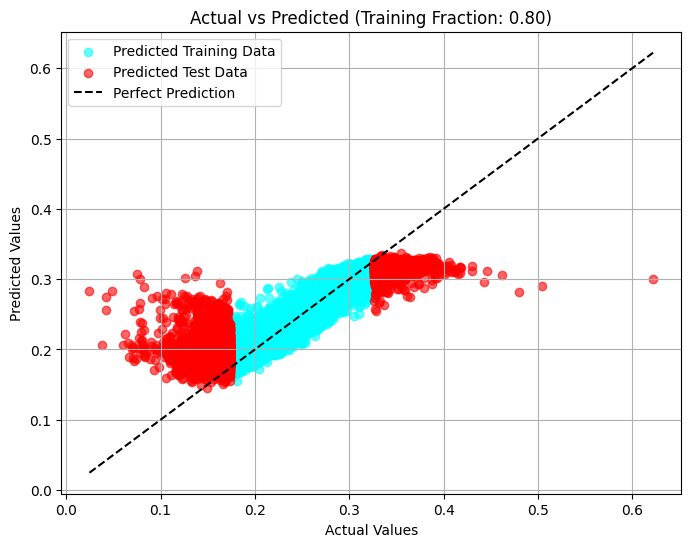

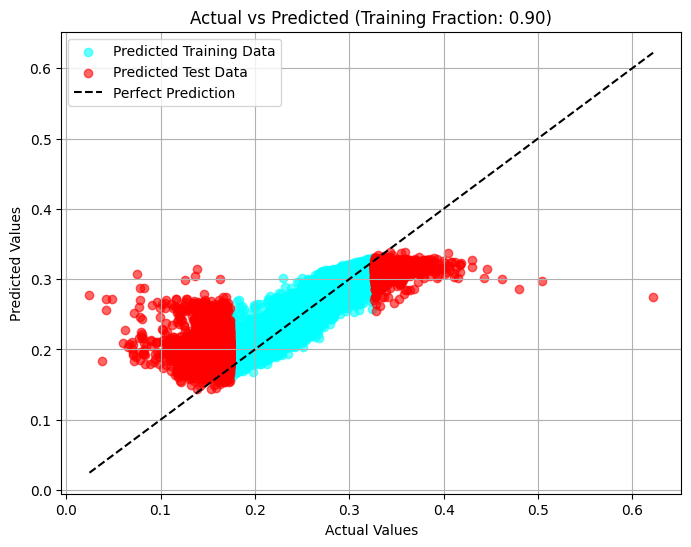

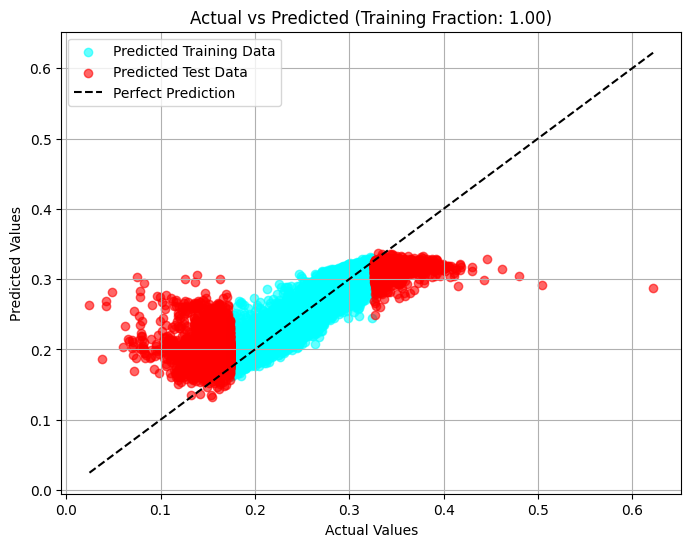

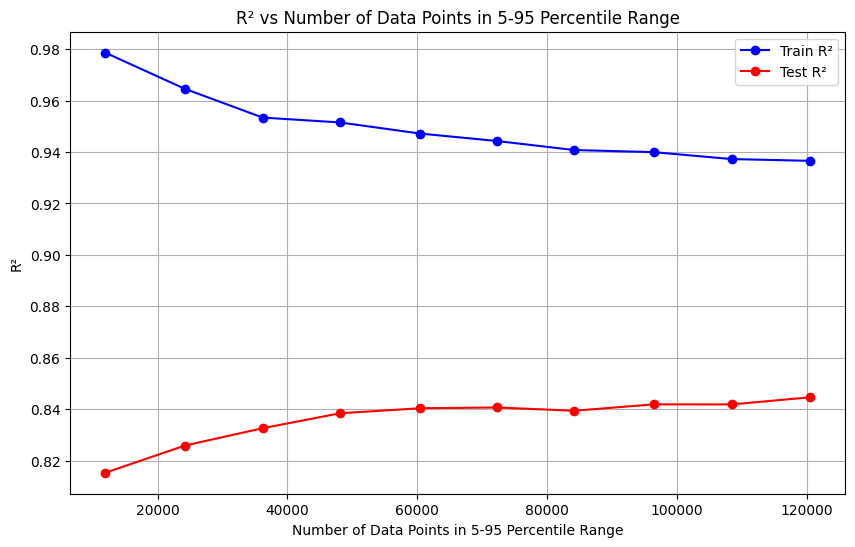

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from rdkit import Chem
from rdkit.Chem import AllChem
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles_chemberta(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))
    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Function to compute Morgan fingerprints
def featurize_smiles_morgan(smiles_list, radius=2, n_bits=2048):
    fingerprints = []
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits=n_bits)
            fingerprints.append(np.array(fp))
        else:
            fingerprints.append(np.zeros(n_bits))  # Use zero vector for invalid SMILES
    return np.array(fingerprints)

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings
smiles = data['SMILES_1'].values
print("Generating ChemBERTa embeddings...")
chemberta_features = featurize_smiles_chemberta(smiles)
print("Generating Morgan fingerprints...")
morgan_features = featurize_smiles_morgan(smiles)

# Combine ChemBERTa embeddings and Morgan fingerprints
combined_features = np.hstack((chemberta_features, morgan_features))

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q5, q95 = np.percentile(Y, [5, 95])

# Initialize the model
model = XGBRegressor(random_state=42)

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_5_95 = []

fractions = np.linspace(0.1, 1.0, 10)

for fraction in fractions:
    # Filter data within the 5-95 percentile range
    train_indices = (Y > q5) & (Y <= q95)
    train_subset_indices = train_indices & (np.random.rand(len(Y)) < fraction)
    test_indices = (Y <= q5) | (Y > q95)

    # Split data into training and testing sets
    X_train = combined_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = combined_features[test_indices]
    Y_test = Y[test_indices]

    # Train the model
    model.fit(X_train, Y_train)

    # Predict and calculate R² scores
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_5_95.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.2f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_5_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_5_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 5-95 Percentile Range")
plt.xlabel("Number of Data Points in 5-95 Percentile Range")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


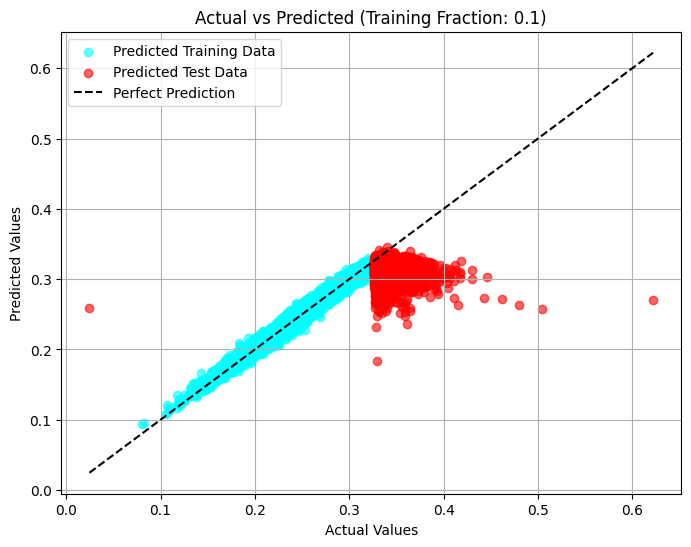

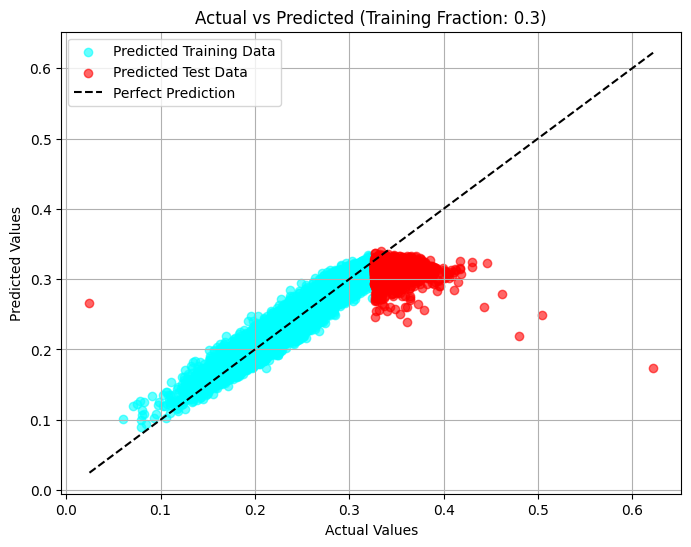

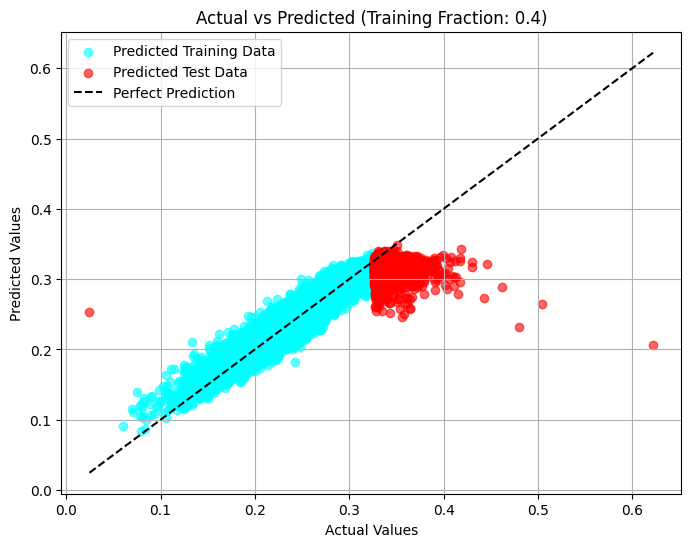

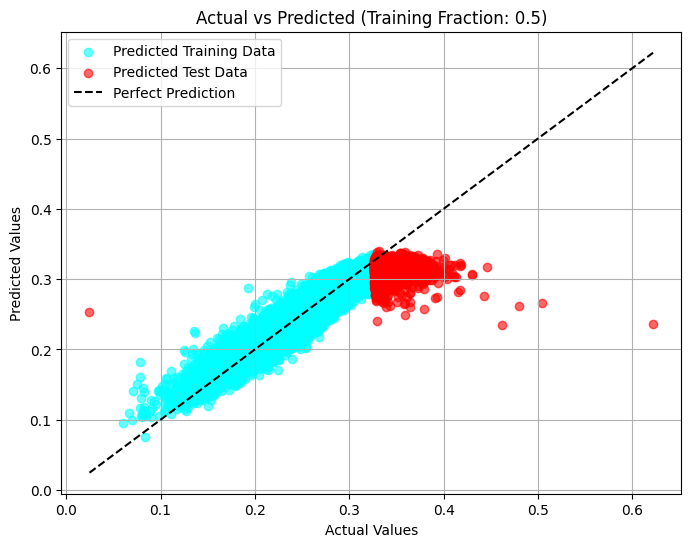

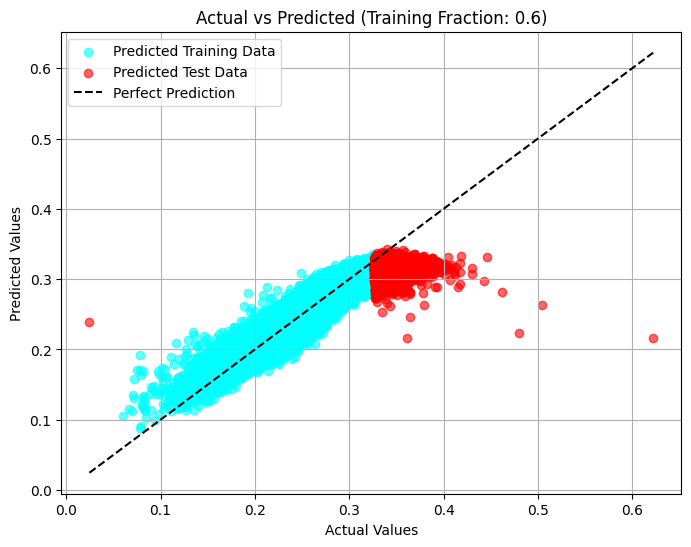

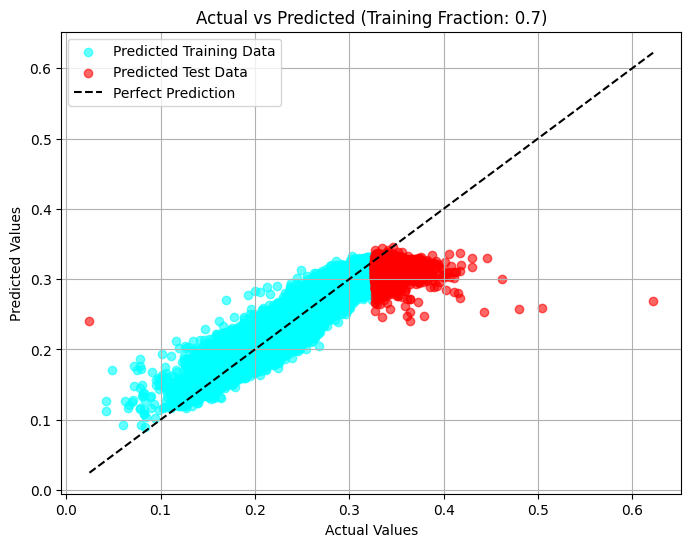

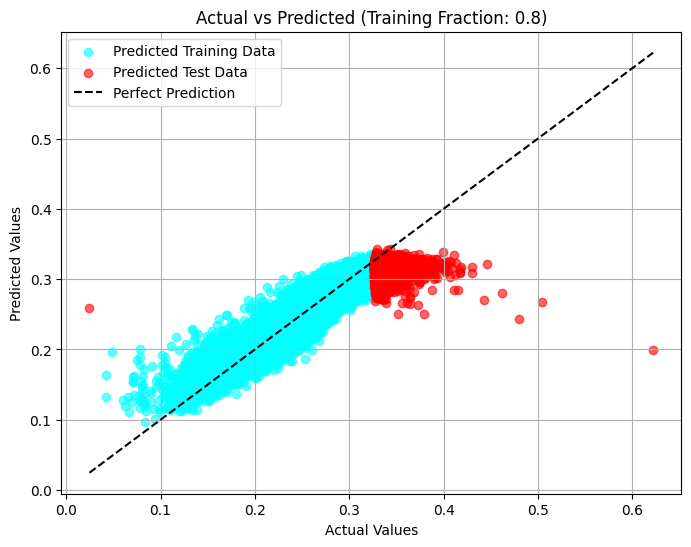

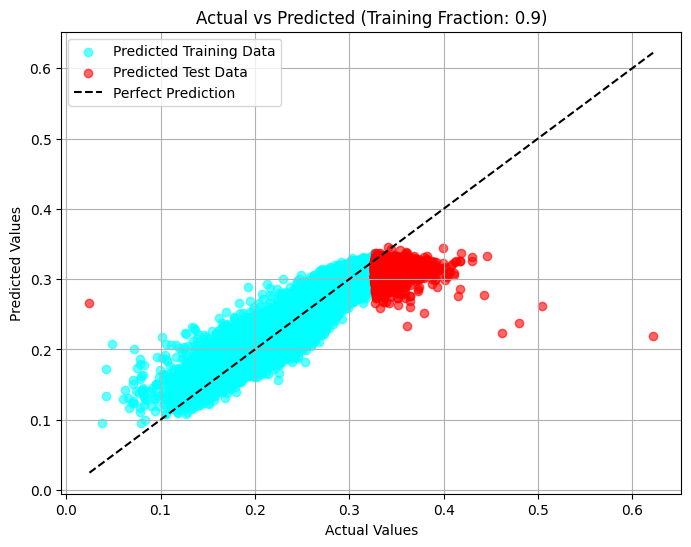

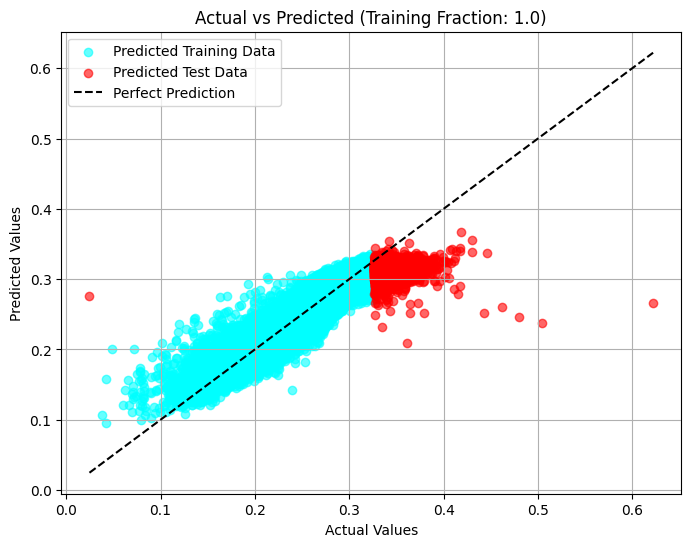

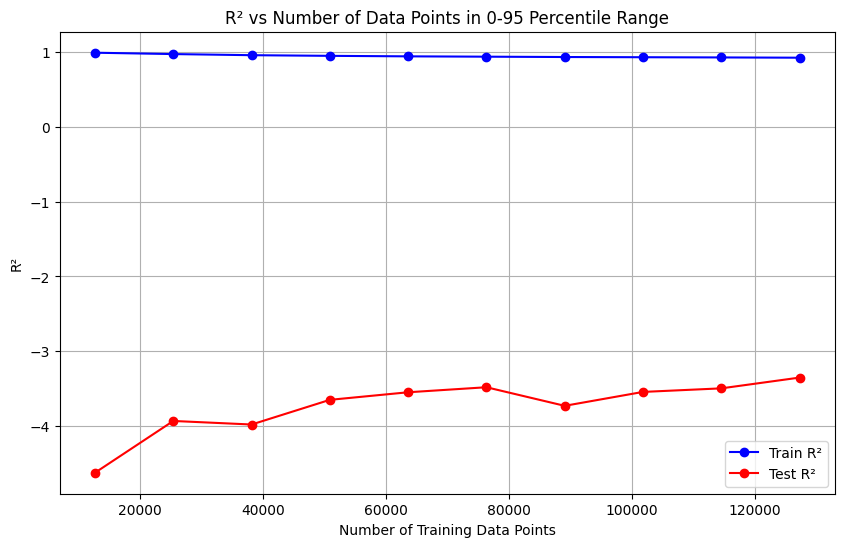

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q0, q95 = np.percentile(Y, [0, 95])

# Initialize the default model
model = XGBRegressor(random_state=42)

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_0_95 = []

# Define training data fractions (similar to np.linspace)
fractions = np.linspace(0.1, 1.0, 10)

# Total number of data points in the 0-95 percentile range
total_data_points = len(Y[(Y > q0) & (Y <= q95)])

for fraction in fractions:
    train_size = int(fraction * total_data_points)
    
    # Filter data within the 0-95 percentile range for training
    train_indices = (Y > q0) & (Y <= q95)
    train_subset_indices = np.where(train_indices)[0][:train_size]
    test_indices = np.where((Y <= q0) | (Y > q95))[0]
    
    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]

    # Train the model
    model.fit(X_train, Y_train)

    # Predict and calculate R^2 scores
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_0_95.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.1f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R^2 vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_0_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_0_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 0-95 Percentile Range")
plt.xlabel("Number of Training Data Points")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


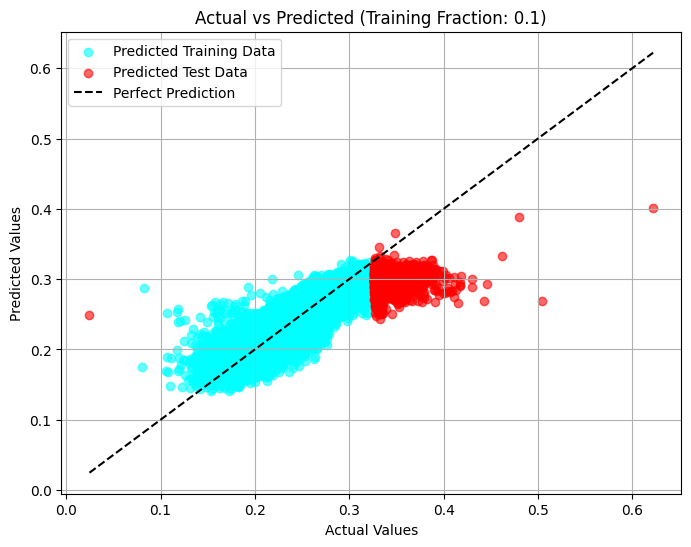

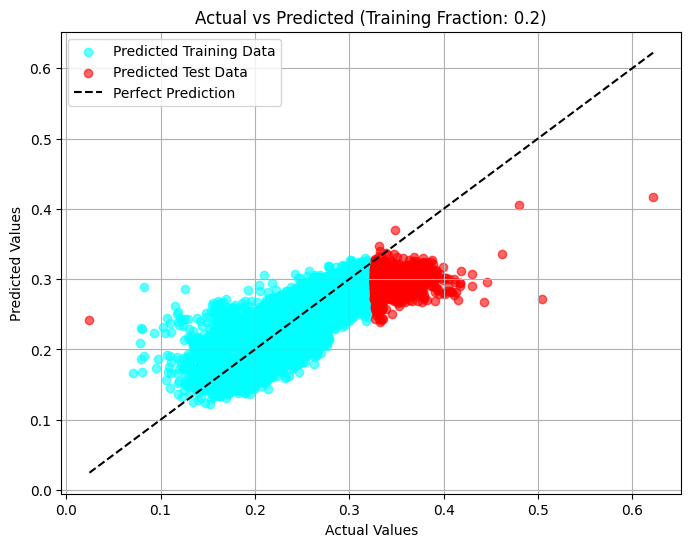

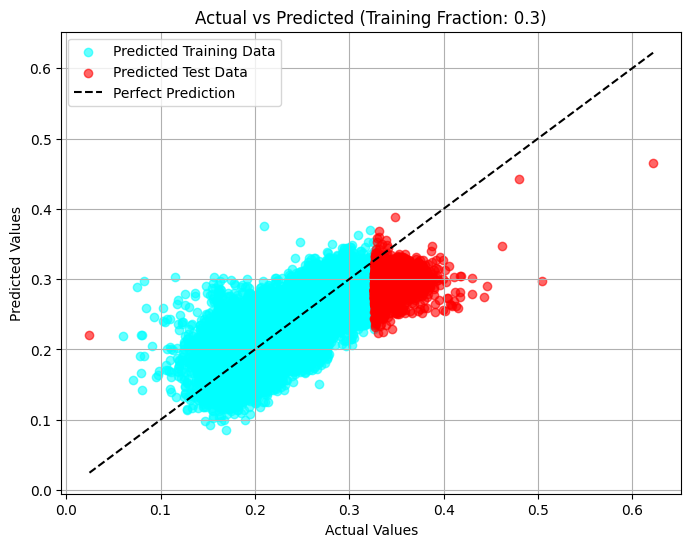

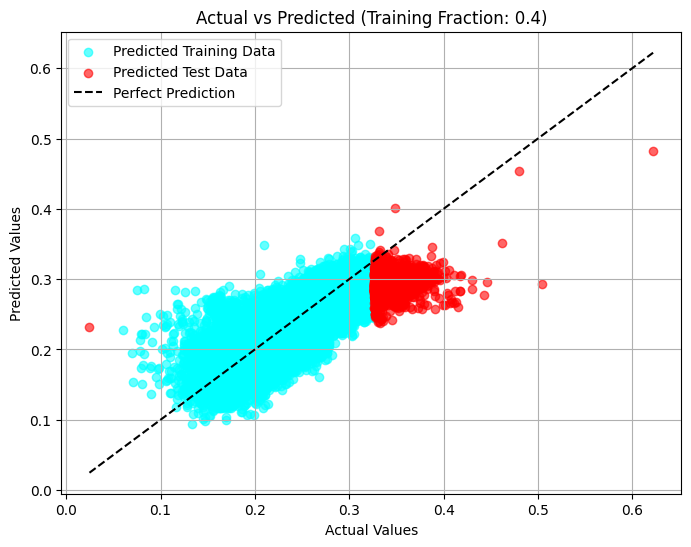

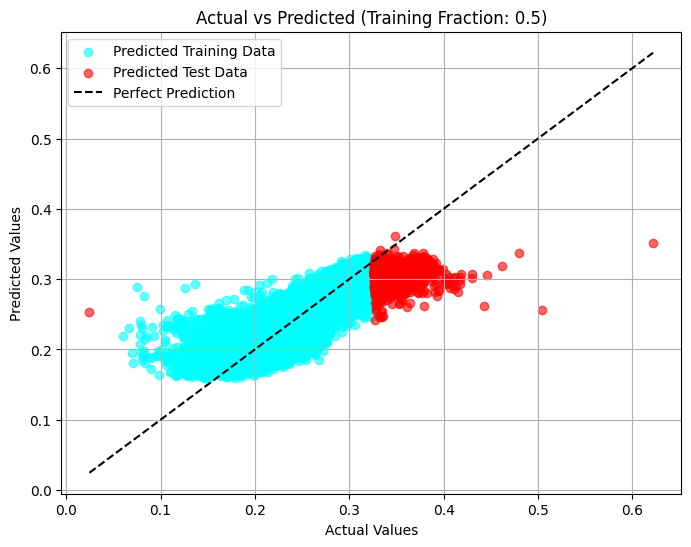

...

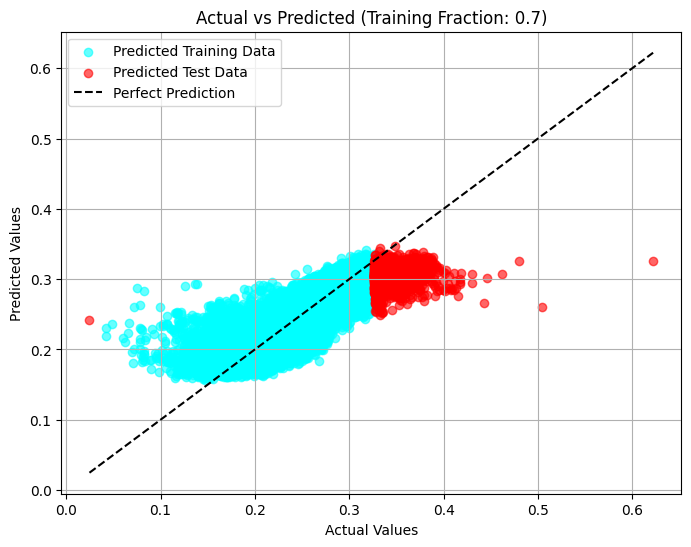

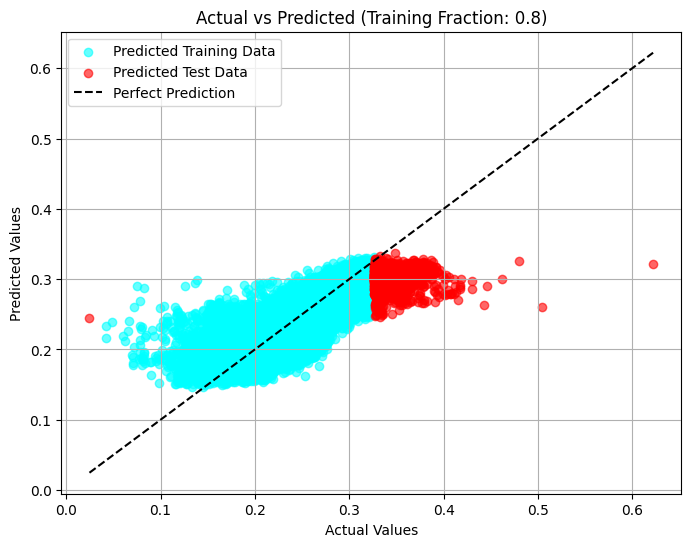

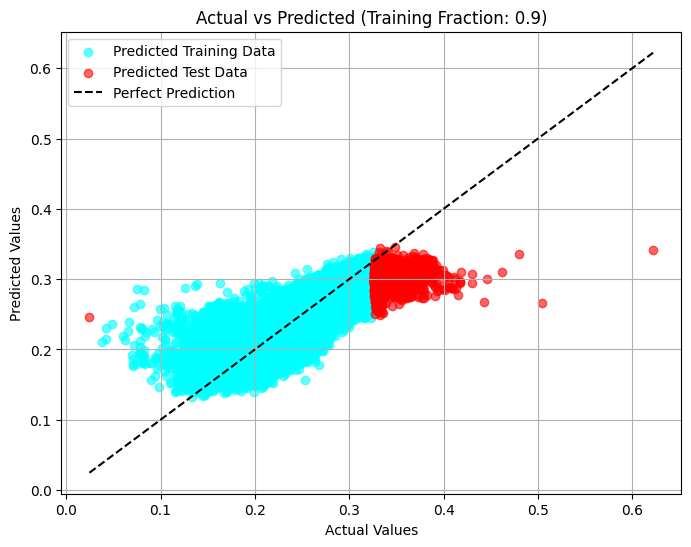

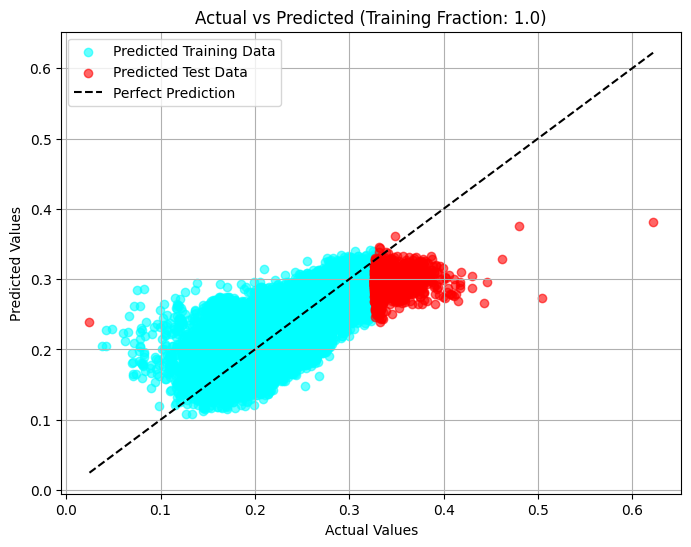

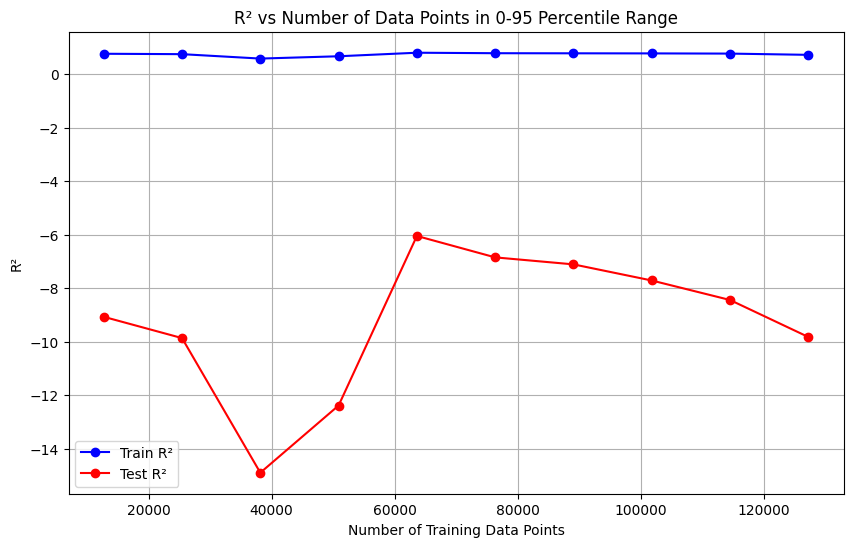

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))
    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# ANN model
class ANNModel(nn.Module):
    def __init__(self, input_dim):
        super(ANNModel, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(64, 1)
        )

    def forward(self, x):
        return self.model(x)

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q0, q95 = np.percentile(Y, [0, 95])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_0_95 = []

# Define training data fractions
fractions = np.linspace(0.1, 1.0, 10)

# Total number of data points in the 0-95 percentile range
total_data_points = len(Y[(Y > q0) & (Y <= q95)])

# Loss and optimizer
criterion = nn.MSELoss()

for fraction in fractions:
    train_size = int(fraction * total_data_points)
    
    # Filter data within the 0-95 percentile range for training
    train_indices = (Y > q0) & (Y <= q95)
    train_subset_indices = np.where(train_indices)[0][:train_size]
    test_indices = np.where((Y <= q0) | (Y > q95))[0]
    
    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]
    
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
    Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
    Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1).to(device)
    
    # Initialize ANN model
    input_dim = X_train.shape[1]
    model = ANNModel(input_dim).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    
    # Train the model
    model.train()
    epochs = 100
    for epoch in range(epochs):
        optimizer.zero_grad()
        predictions = model(X_train_tensor)
        loss = criterion(predictions, Y_train_tensor)
        loss.backward()
        optimizer.step()
    
    # Evaluate the model
    model.eval()
    with torch.no_grad():
        Y_train_pred = model(X_train_tensor).cpu().numpy().flatten()
        Y_test_pred = model(X_test_tensor).cpu().numpy().flatten()

    # Calculate R² scores
    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)
    
    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_0_95.append(len(Y_train))
    
    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.1f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R² vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_0_95, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_0_95, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 0-95 Percentile Range")
plt.xlabel("Number of Training Data Points")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


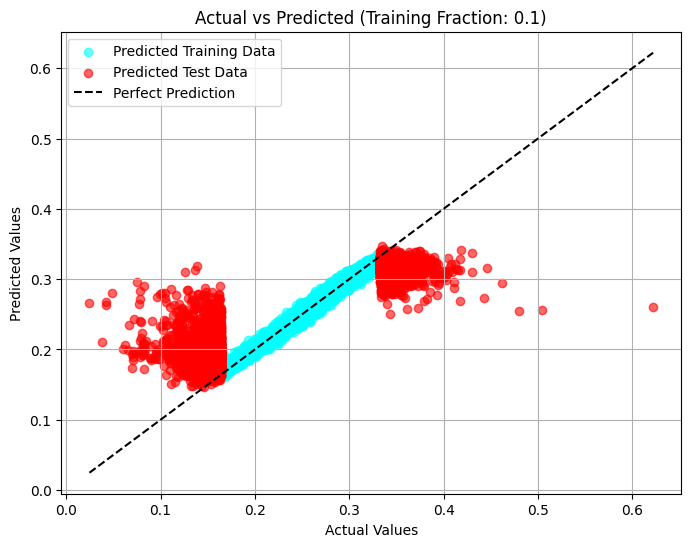

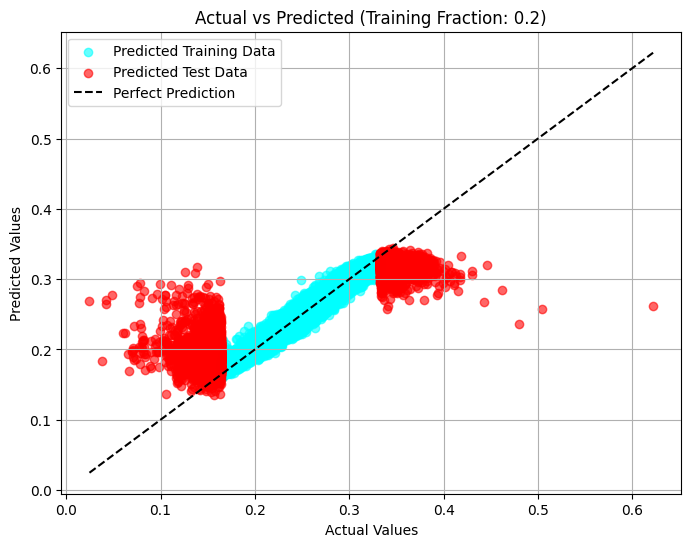

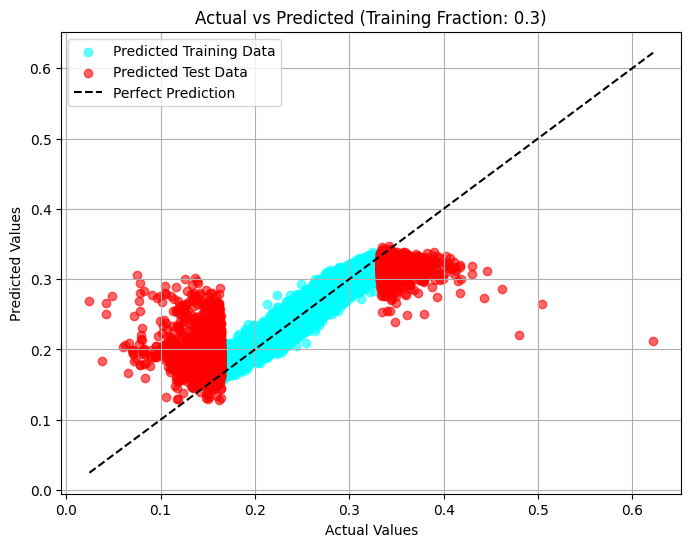

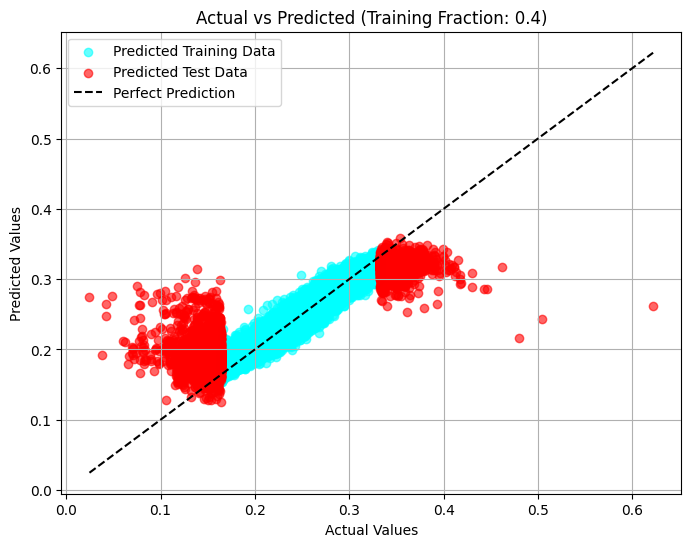

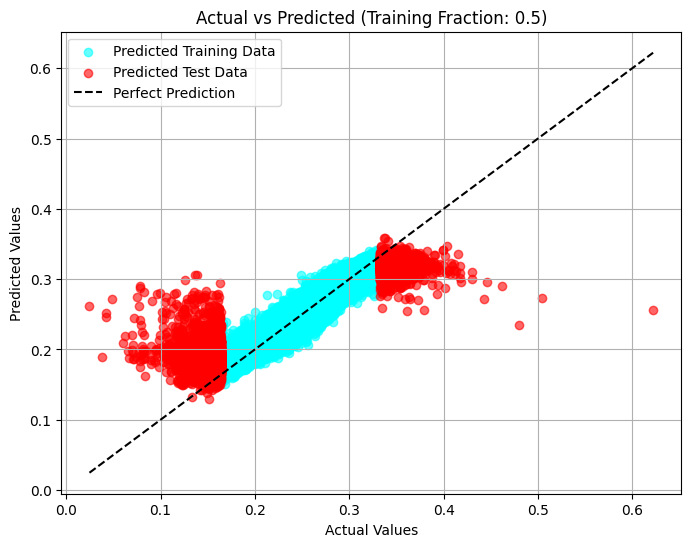

...

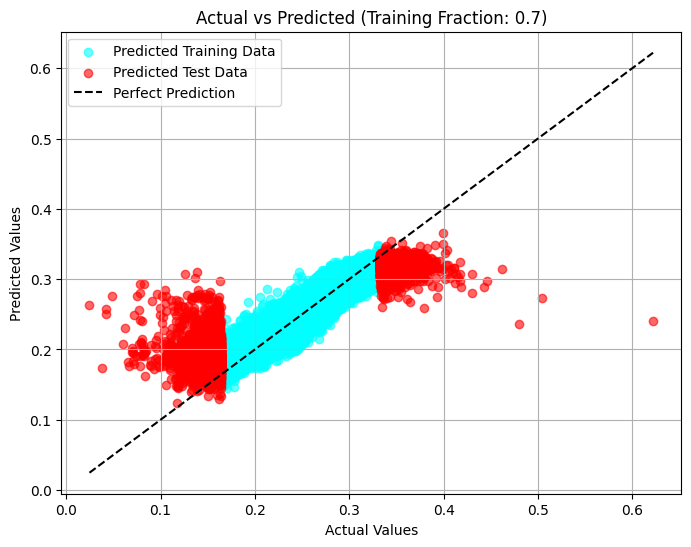

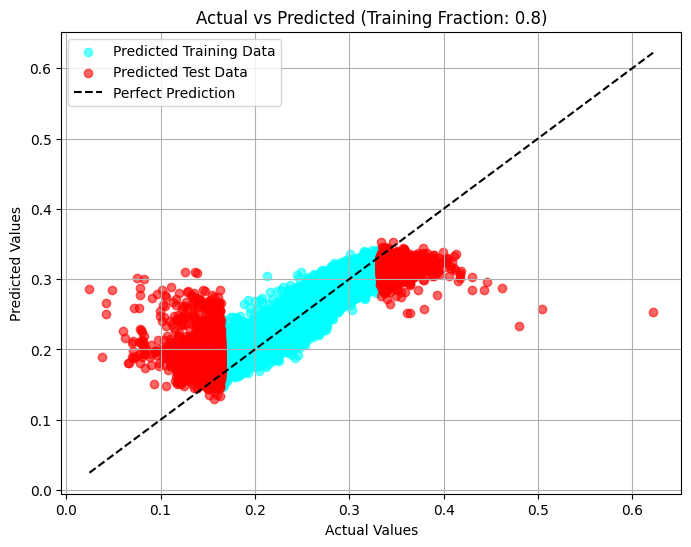

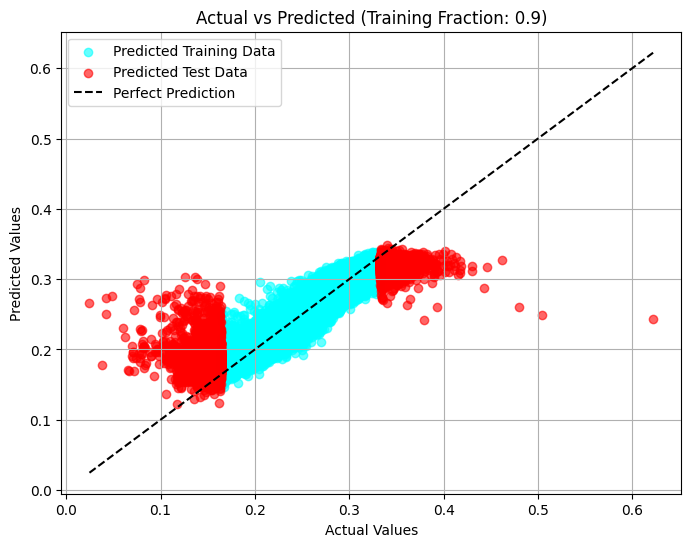

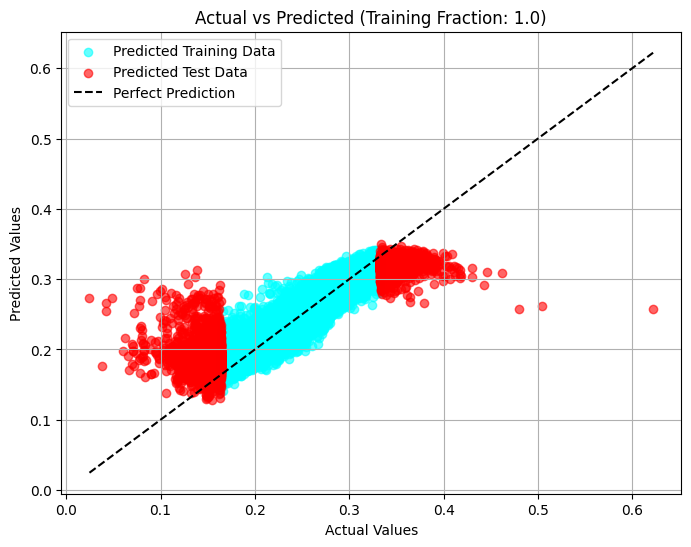

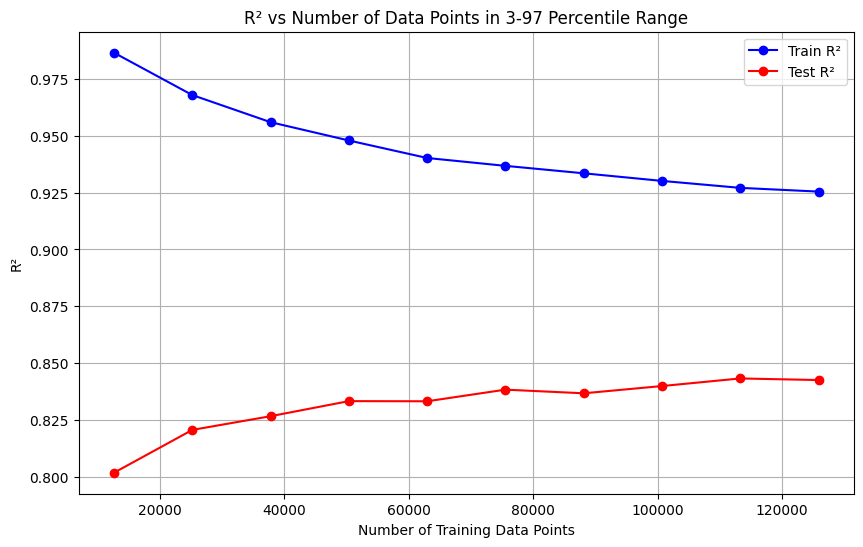

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q3, q97 = np.percentile(Y, [3, 97])

# Initialize the default model
model = XGBRegressor(random_state=42)

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_3_97 = []

# Define training data fractions (similar to np.linspace)
fractions = np.linspace(0.1, 1.0, 10)

# Total number of data points in the 3-97 percentile range
total_data_points = len(Y[(Y > q3) & (Y <= q97)])

for fraction in fractions:
    train_size = int(fraction * total_data_points)
    
    # Filter data within the 3-97 percentile range for training
    train_indices = (Y > q3) & (Y <= q97)
    train_subset_indices = np.where(train_indices)[0][:train_size]
    test_indices = np.where((Y <= q3) | (Y > q97))[0]
    
    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]

    # Train the model
    model.fit(X_train, Y_train)

    # Predict and calculate R^2 scores
    Y_train_pred = model.predict(X_train)
    Y_test_pred = model.predict(X_test)

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_3_97.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.1f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R^2 vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_3_97, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_3_97, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 3-97 Percentile Range")
plt.xlabel("Number of Training Data Points")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activi

394/394 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


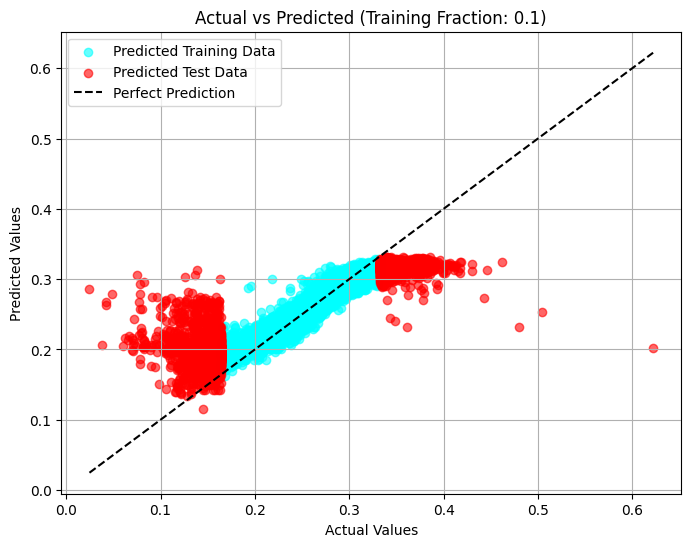

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


787/787 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


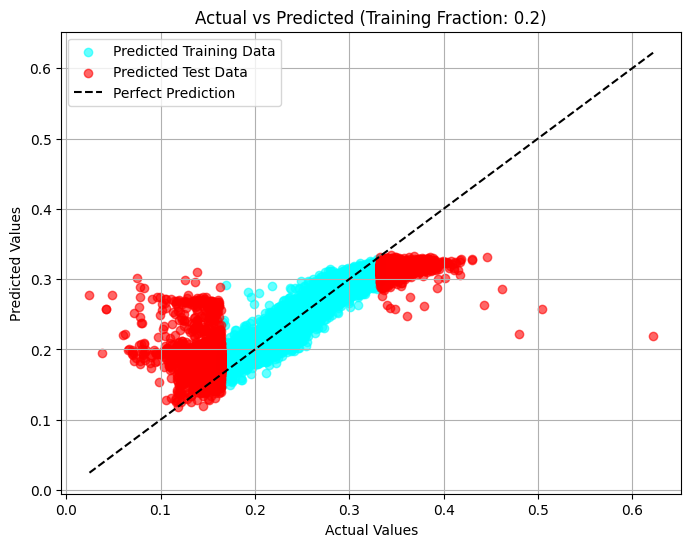

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1181/1181 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


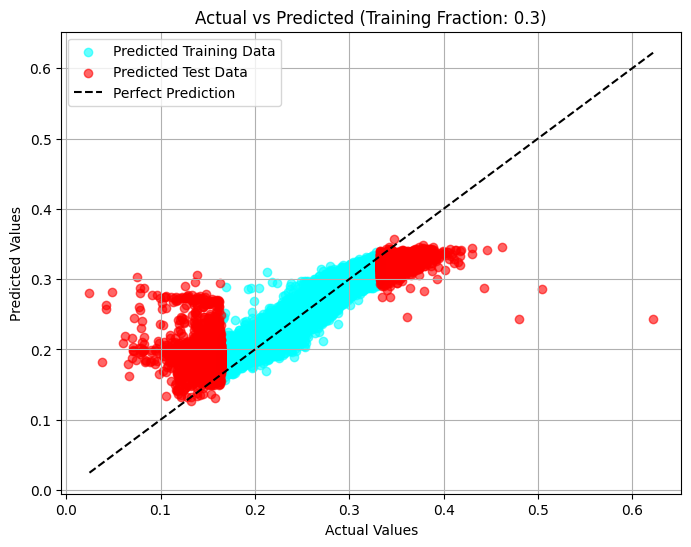

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1574/1574 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


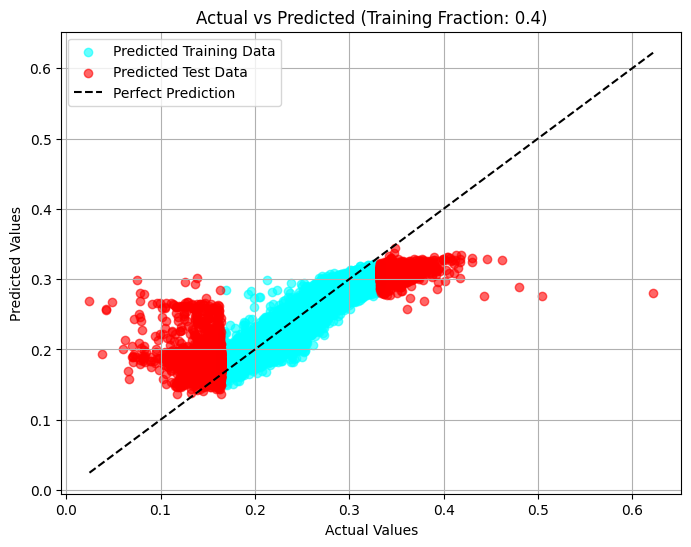

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1967/1967 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


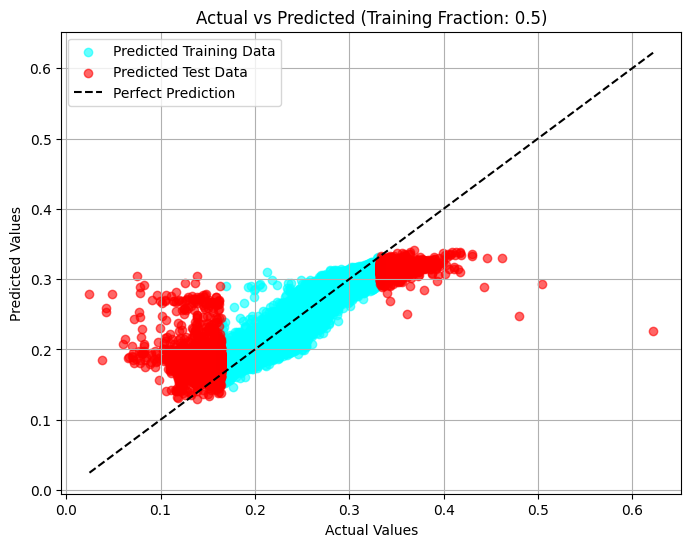

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2361/2361 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


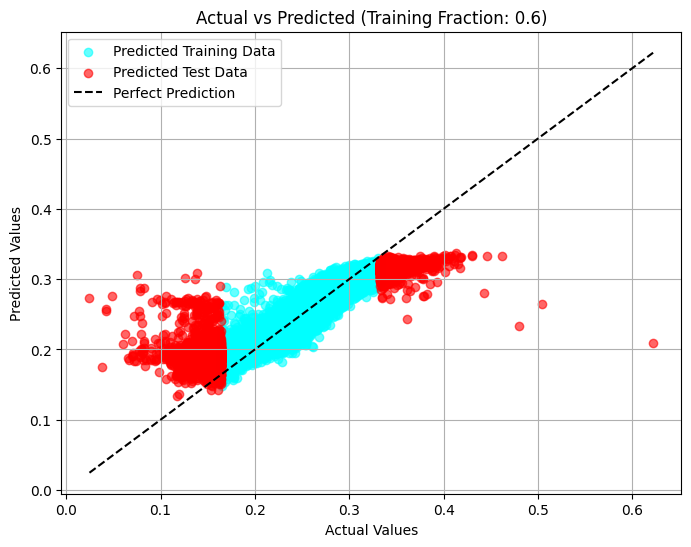

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2754/2754 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


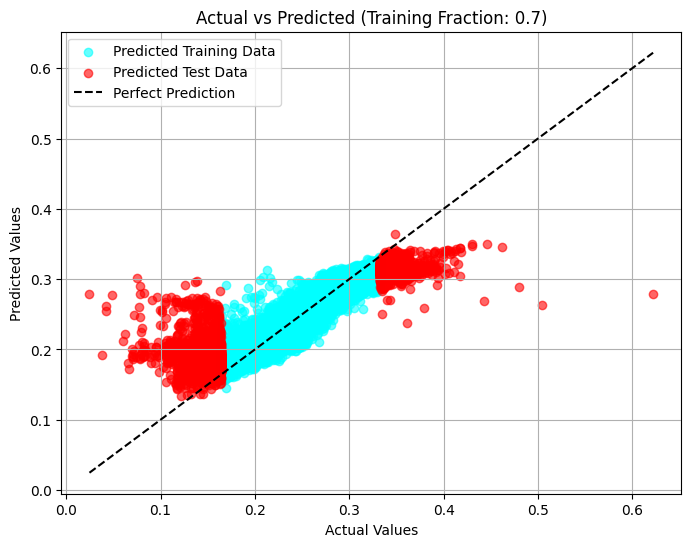

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3147/3147 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


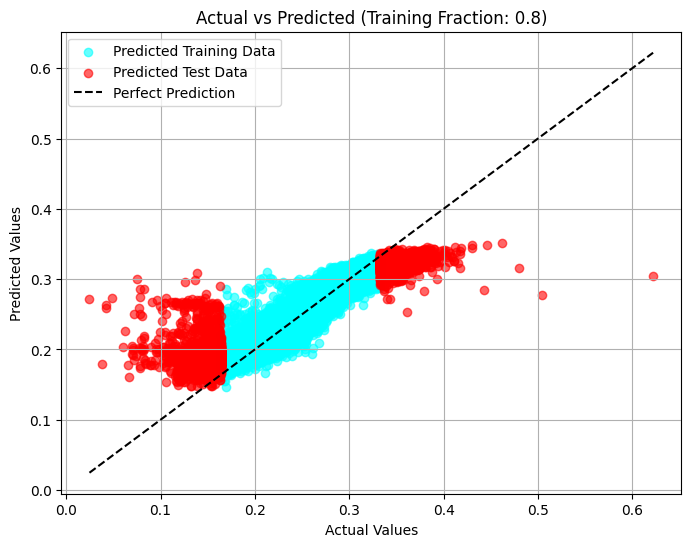

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3541/3541 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


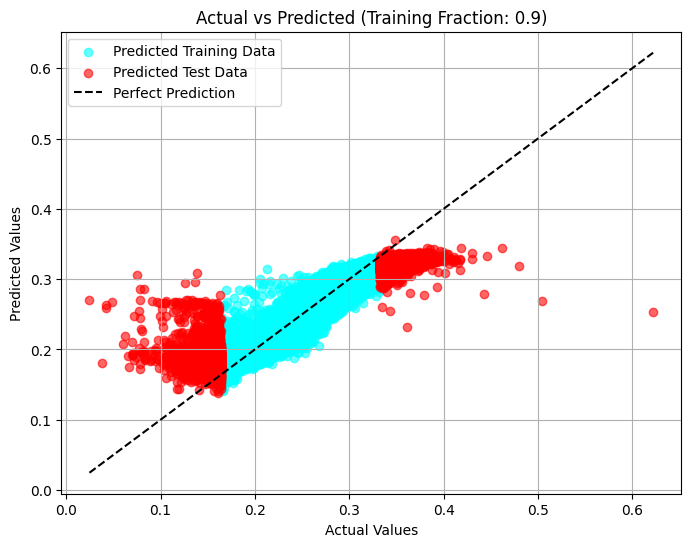

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3934/3934 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


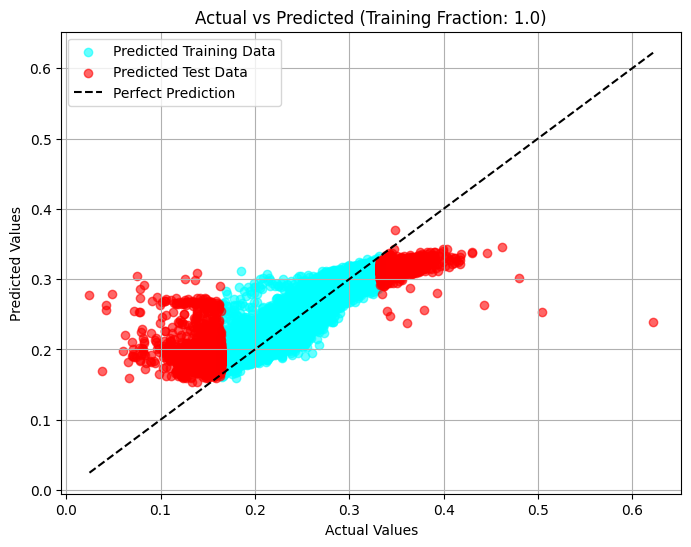

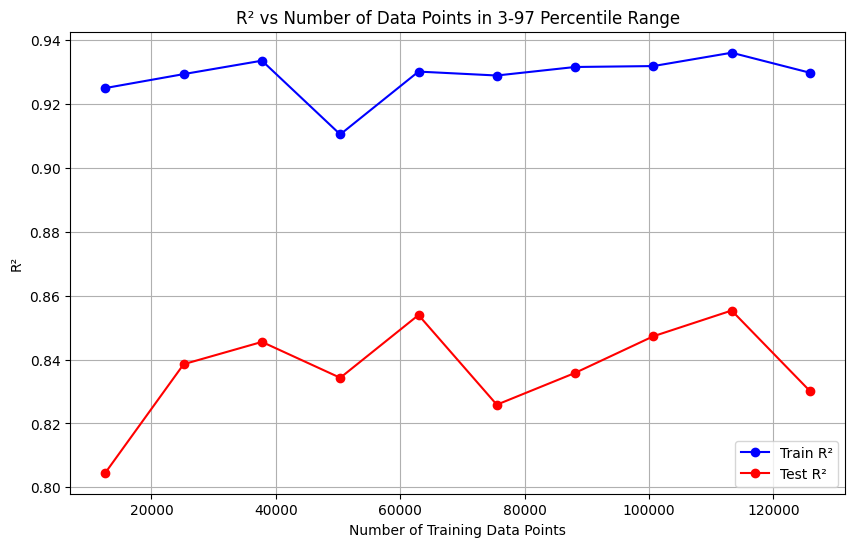

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Function to featurize SMILES strings using ChemBERTa
def featurize_smiles(smiles_list):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            encoded = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))

    features_tensor = torch.stack(features)
    return features_tensor.cpu().numpy()

# Load the data
data_path = "/kaggle/input/entiredata/entire_data.xlsx"
data = pd.read_excel(data_path)

# Featurize SMILES strings using ChemBERTa
smiles = data['SMILES_1'].values
chemberta_features = featurize_smiles(smiles)

# Select the target property
target = 'gap'
Y = data[target].values

# Calculate percentiles
q3, q97 = np.percentile(Y, [3, 97])

# Initialize results
r2_test_scores = []
r2_train_scores = []
data_points_3_97 = []

# Define training data fractions
fractions = np.linspace(0.1, 1.0, 10)

# Total number of data points in the 3-97 percentile range
total_data_points = len(Y[(Y > q3) & (Y <= q97)])

for fraction in fractions:
    train_size = int(fraction * total_data_points)
    
    # Filter data within the 3-97 percentile range for training
    train_indices = (Y > q3) & (Y <= q97)
    train_subset_indices = np.where(train_indices)[0][:train_size]
    test_indices = np.where((Y <= q3) | (Y > q97))[0]
    
    # Split data into training and testing sets
    X_train = chemberta_features[train_subset_indices]
    Y_train = Y[train_subset_indices]
    X_test = chemberta_features[test_indices]
    Y_test = Y[test_indices]

    # Build the ANN model
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(1)  # Regression output
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

    # Train the ANN model
    model.fit(X_train, Y_train, epochs=50, batch_size=32, verbose=0)

    # Predict and calculate R^2 scores
    Y_train_pred = model.predict(X_train).flatten()
    Y_test_pred = model.predict(X_test).flatten()

    r2_train = r2_score(Y_train, Y_train_pred)
    r2_test = r2_score(Y_test, Y_test_pred)

    r2_train_scores.append(r2_train)
    r2_test_scores.append(r2_test)
    data_points_3_97.append(len(Y_train))

    # Plot Actual vs Predicted for each fraction
    plt.figure(figsize=(8, 6))
    plt.scatter(Y_train, Y_train_pred, color='cyan', alpha=0.6, label='Predicted Training Data')
    plt.scatter(Y_test, Y_test_pred, color='red', alpha=0.6, label='Predicted Test Data')
    plt.plot([min(Y), max(Y)], [min(Y), max(Y)], color='black', linestyle='--', label='Perfect Prediction')
    plt.title(f"Actual vs Predicted (Training Fraction: {fraction:.1f})")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend()
    plt.grid()
    plt.show()

# Plot R^2 vs number of data points for both train and test data
plt.figure(figsize=(10, 6))
plt.plot(data_points_3_97, r2_train_scores, marker='o', linestyle='-', color='blue', label="Train R²")
plt.plot(data_points_3_97, r2_test_scores, marker='o', linestyle='-', color='red', label="Test R²")
plt.title("R² vs Number of Data Points in 3-97 Percentile Range")
plt.xlabel("Number of Training Data Points")
plt.ylabel("R²")
plt.legend()
plt.grid()
plt.show()


Epoch 1/100, Train Loss: 0.0020, Validation Loss: 0.0006
Epoch 2/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 3/100, Train Loss: 0.0002, Validation Loss: 0.0003
Epoch 4/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 5/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 6/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 7/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 8/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 9/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 10/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 11/100, Train Loss: 0.0001, Validation Loss: 0.0003
Epoch 12/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 13/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 14/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 15/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 16/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 17/100, Train Loss: 0.0000, Validation Loss: 0.0003
Epoch 18/100, Train Los

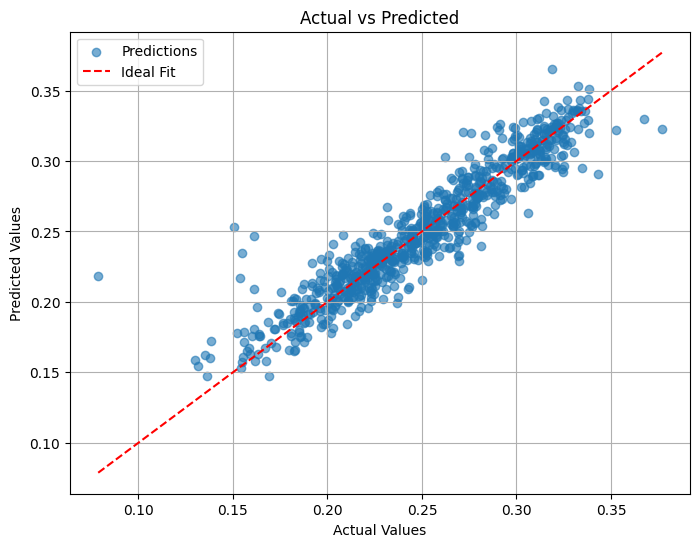

In [6]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from rdkit import Chem
from rdkit.Chem import AllChem
import matplotlib.pyplot as plt
import time

# Define Morgan fingerprint-based featurization
def featurize_smiles(smiles_list, radius=2, n_bits=2048):
    features = []
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits=n_bits)
            features.append(np.array(fp))
        else:
            # Handle invalid SMILES strings
            features.append(np.zeros(n_bits))
    return np.array(features, dtype=np.float32)

# Load data
df = pd.read_excel('/kaggle/input/data20k/Data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Featurize using Morgan fingerprints
features = featurize_smiles(smiles)

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/MorganFP_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()


In [3]:
pip install rdkit-pypi


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 63.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


Epoch 1/100, Train Loss: 0.0013, Validation Loss: 0.0006
Epoch 2/100, Train Loss: 0.0006, Validation Loss: 0.0005
Epoch 3/100, Train Loss: 0.0006, Validation Loss: 0.0005
Epoch 4/100, Train Loss: 0.0005, Validation Loss: 0.0005
Epoch 5/100, Train Loss: 0.0005, Validation Loss: 0.0005
Epoch 6/100, Train Loss: 0.0004, Validation Loss: 0.0005
Epoch 7/100, Train Loss: 0.0004, Validation Loss: 0.0007
Epoch 8/100, Train Loss: 0.0004, Validation Loss: 0.0005
Epoch 9/100, Train Loss: 0.0004, Validation Loss: 0.0004
Epoch 10/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 11/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 12/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 13/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 14/100, Train Loss: 0.0003, Validation Loss: 0.0005
Epoch 15/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 16/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 17/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 18/100, Train Los

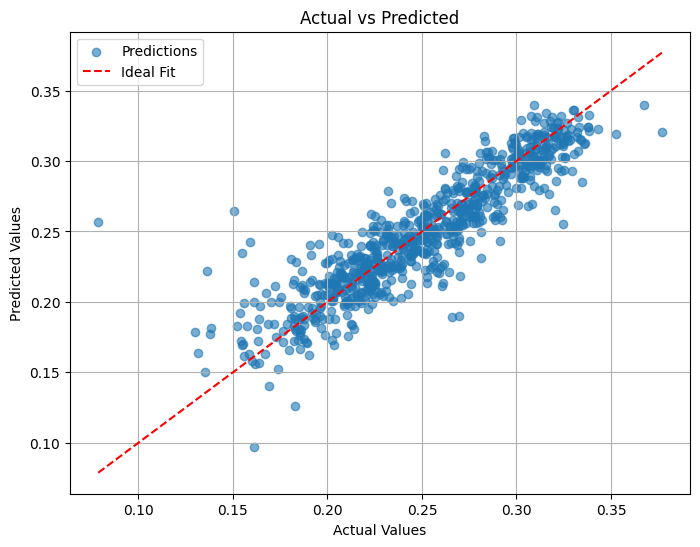

In [7]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import time

# Function to convert SMILES to one-hot encoding
def one_hot_encode_smiles(smiles_list, max_length=100, charset=None):
    # Generate character set if not provided
    if charset is None:
        charset = set(char for smiles in smiles_list for char in smiles)
    char_to_int = {char: i + 1 for i, char in enumerate(charset)}  # 1-based index
    int_to_char = {i + 1: char for i, char in enumerate(charset)}
    char_to_int['PAD'] = 0  # Padding index
    
    # Encode SMILES strings
    encoded_smiles = []
    for smiles in smiles_list:
        encoded = [char_to_int[char] for char in smiles if char in char_to_int]
        if len(encoded) > max_length:
            encoded = encoded[:max_length]
        else:
            encoded += [0] * (max_length - len(encoded))  # Pad to max_length
        encoded_smiles.append(encoded)
    
    return np.array(encoded_smiles, dtype=np.int32), len(charset) + 1  # Include padding index in charset size

# Load data
df = pd.read_excel('/kaggle/input/data20k/Data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Encode SMILES using one-hot encoding
encoded_smiles, vocab_size = one_hot_encode_smiles(smiles)
features = np.eye(vocab_size)[encoded_smiles]  # One-hot encode to 3D tensor
features = features.reshape(features.shape[0], -1)  # Flatten into 2D tensor

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/OneHotEncoding_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Epoch 1/100, Train Loss: 0.0014, Validation Loss: 0.0009
Epoch 2/100, Train Loss: 0.0009, Validation Loss: 0.0008
Epoch 3/100, Train Loss: 0.0008, Validation Loss: 0.0007
Epoch 4/100, Train Loss: 0.0008, Validation Loss: 0.0007
Epoch 5/100, Train Loss: 0.0007, Validation Loss: 0.0009
Epoch 6/100, Train Loss: 0.0007, Validation Loss: 0.0008
Epoch 7/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 8/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 9/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 10/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 11/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 12/100, Train Loss: 0.0007, Validation Loss: 0.0006
Epoch 13/100, Train Loss: 0.0006, Validation Loss: 0.0007
Epoch 14/100, Train Loss: 0.0007, Validation Loss: 0.0007
Epoch 15/100, Train Loss: 0.0006, Validation Loss: 0.0006
Epoch 16/100, Train Loss: 0.0007, Validation Loss: 0.0006
Epoch 17/100, Train Loss: 0.0006, Validation Loss: 0.0007
Epoch 18/100, Train Los

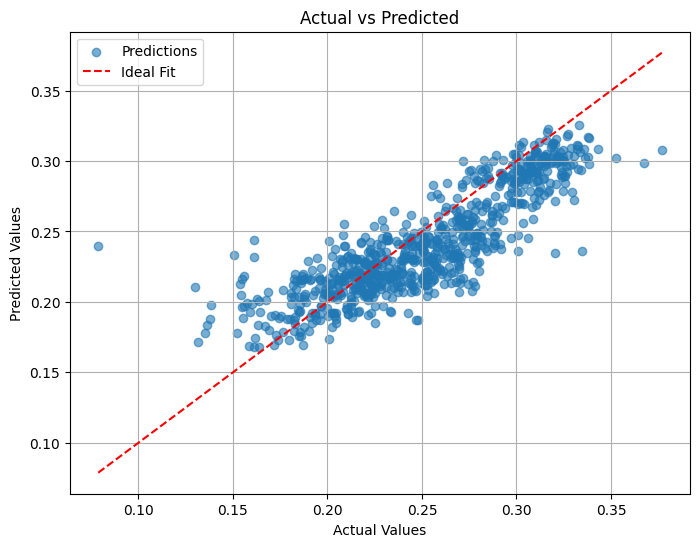

In [1]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from transformers import AutoTokenizer, AutoModel
import matplotlib.pyplot as plt
import time

# Load BERT model and tokenizer
model_name = "bert-base-uncased"  # Use a general-purpose BERT model
tokenizer = AutoTokenizer.from_pretrained(model_name)
bert_model = AutoModel.from_pretrained(model_name)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
bert_model.to(device)
bert_model.eval()

# Define function for BERT-based featurization
def featurize_smiles_with_bert(smiles_list, max_length=128):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            # Tokenize and pad/truncate input
            encoded = tokenizer(smiles, return_tensors="pt", padding="max_length", truncation=True, max_length=max_length).to(device)
            output = bert_model(**encoded)
            features.append(output.pooler_output.squeeze(0))  # Use [CLS] token representation

    features_tensor = torch.stack(features)
    return features_tensor.to(dtype=torch.float32)

# Load data
df = pd.read_excel('/kaggle/input/data20k/Data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Featurize using BERT
features = featurize_smiles_with_bert(smiles).cpu().numpy()

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/BERT_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()



tokenizer_config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/8.26k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/420 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/14.0M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at DeepChem/ChemBERTa-77M-MTR and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1/100, Train Loss: 0.0018, Validation Loss: 0.0004
Epoch 2/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 3/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 4/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 5/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 6/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 7/100, Train Loss: 0.0002, Validation Loss: 0.0003
Epoch 8/100, Train Loss: 0.0002, Validation Loss: 0.0003
Epoch 9/100, Train Loss: 0.0002, Validation Loss: 0.0003
Epoch 10/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 11/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 12/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 13/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 14/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 15/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 16/100, Train Loss: 0.0002, Validation Loss: 0.0003
Epoch 17/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 18/100, Train Los

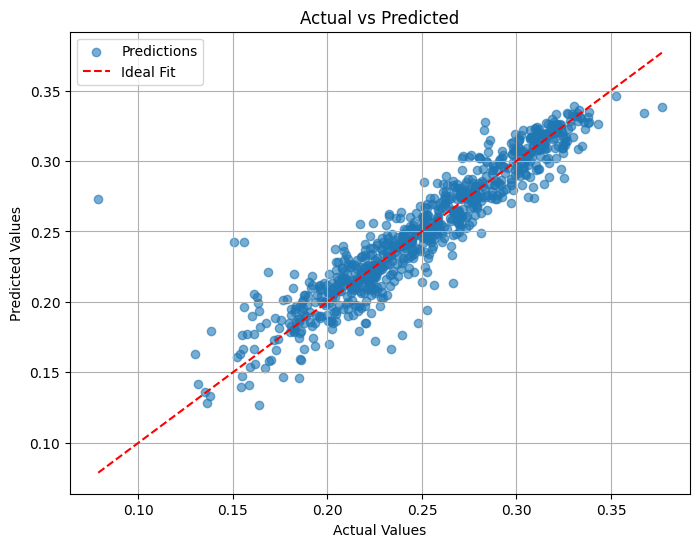

In [2]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from transformers import AutoTokenizer, AutoModel
import matplotlib.pyplot as plt
import time

# Load ChemBERTa model and tokenizer
model_name = "DeepChem/ChemBERTa-77M-MTR"  # ChemBERTa pretrained model
tokenizer = AutoTokenizer.from_pretrained(model_name)
chemberta_model = AutoModel.from_pretrained(model_name)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
chemberta_model.to(device)
chemberta_model.eval()

# Define function for ChemBERTa-based featurization
def featurize_smiles_with_chemberta(smiles_list, max_length=128):
    features = []
    with torch.no_grad():
        for smiles in smiles_list:
            # Tokenize and pad/truncate input
            encoded = tokenizer(smiles, return_tensors="pt", padding="max_length", truncation=True, max_length=max_length).to(device)
            output = chemberta_model(**encoded)
            features.append(output.pooler_output.squeeze(0))  # Use [CLS] token representation

    features_tensor = torch.stack(features)
    return features_tensor.to(dtype=torch.float32)

# Load data
df = pd.read_excel('/kaggle/input/data20k/Data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Featurize using ChemBERTa
features = featurize_smiles_with_chemberta(smiles).cpu().numpy()

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/ChemBERTa_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()


Epoch 1/100, Train Loss: 0.0007, Validation Loss: 0.0006
Epoch 2/100, Train Loss: 0.0005, Validation Loss: 0.0004
Epoch 3/100, Train Loss: 0.0004, Validation Loss: 0.0004
Epoch 4/100, Train Loss: 0.0004, Validation Loss: 0.0004
Epoch 5/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 6/100, Train Loss: 0.0003, Validation Loss: 0.0004
Epoch 7/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 8/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 9/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 10/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 11/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 12/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 13/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 14/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 15/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 16/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 17/100, Train Loss: 0.0003, Validation Loss: 0.0003
Epoch 18/100, Train Los

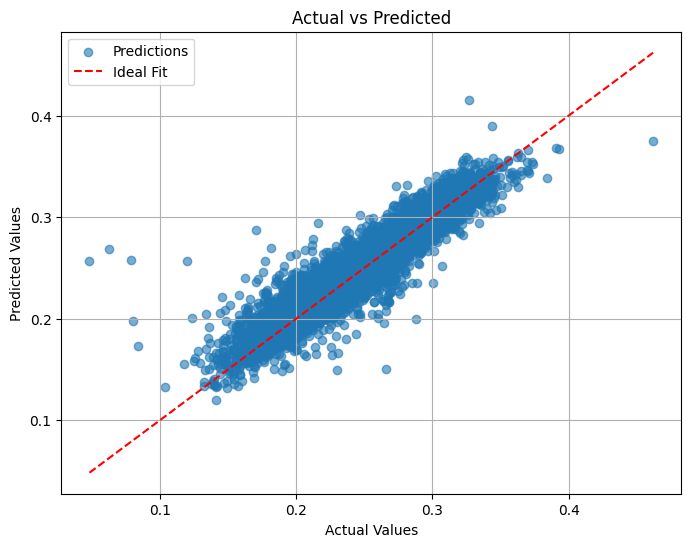

In [1]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import time

# Function to convert SMILES to one-hot encoding
def one_hot_encode_smiles(smiles_list, max_length=100, charset=None):
    # Generate character set if not provided
    if charset is None:
        charset = set(char for smiles in smiles_list for char in smiles)
    char_to_int = {char: i + 1 for i, char in enumerate(charset)}  # 1-based index
    int_to_char = {i + 1: char for i, char in enumerate(charset)}
    char_to_int['PAD'] = 0  # Padding index
    
    # Encode SMILES strings
    encoded_smiles = []
    for smiles in smiles_list:
        encoded = [char_to_int[char] for char in smiles if char in char_to_int]
        if len(encoded) > max_length:
            encoded = encoded[:max_length]
        else:
            encoded += [0] * (max_length - len(encoded))  # Pad to max_length
        encoded_smiles.append(encoded)
    
    return np.array(encoded_smiles, dtype=np.int32), len(charset) + 1  # Include padding index in charset size

# Load data
df = pd.read_excel('/kaggle/input/entiredata/entire_data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Encode SMILES using one-hot encoding
encoded_smiles, vocab_size = one_hot_encode_smiles(smiles)
features = np.eye(vocab_size)[encoded_smiles]  # One-hot encode to 3D tensor
features = features.reshape(features.shape[0], -1)  # Flatten into 2D tensor

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/OneHotEncoding_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()


Epoch 1/100, Train Loss: 0.0007, Validation Loss: 0.0002
Epoch 2/100, Train Loss: 0.0002, Validation Loss: 0.0002
Epoch 3/100, Train Loss: 0.0001, Validation Loss: 0.0002
Epoch 4/100, Train Loss: 0.0001, Validation Loss: 0.0002
Epoch 5/100, Train Loss: 0.0001, Validation Loss: 0.0002
Epoch 6/100, Train Loss: 0.0001, Validation Loss: 0.0002
Epoch 7/100, Train Loss: 0.0001, Validation Loss: 0.0001
Epoch 8/100, Train Loss: 0.0001, Validation Loss: 0.0001
Epoch 9/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 10/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 11/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 12/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 13/100, Train Loss: 0.0000, Validation Loss: 0.0002
Epoch 14/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 15/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 16/100, Train Loss: 0.0000, Validation Loss: 0.0001
Epoch 17/100, Train Loss: 0.0000, Validation Loss: 0.0002
Epoch 18/100, Train Los

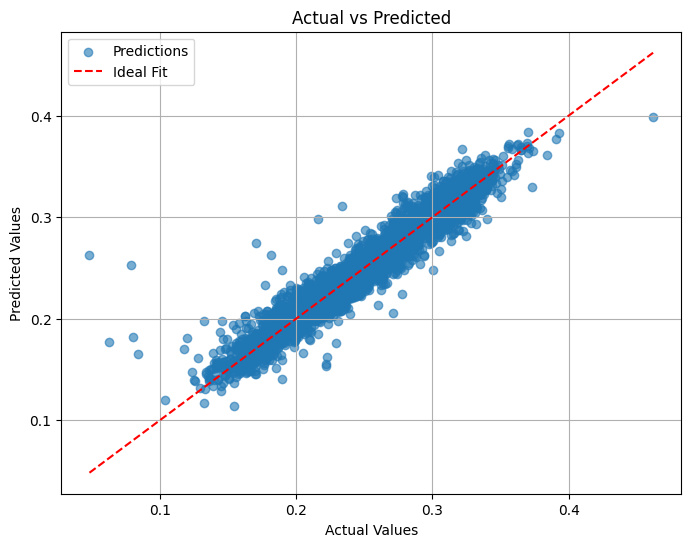

In [4]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from rdkit import Chem
from rdkit.Chem import AllChem
import matplotlib.pyplot as plt
import time

# Define Morgan fingerprint-based featurization
def featurize_smiles(smiles_list, radius=2, n_bits=2048):
    features = []
    for smiles in smiles_list:
        mol = Chem.MolFromSmiles(smiles)
        if mol:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, radius, nBits=n_bits)
            features.append(np.array(fp))
        else:
            # Handle invalid SMILES strings
            features.append(np.zeros(n_bits))
    return np.array(features, dtype=np.float32)

# Load data
df = pd.read_excel('/kaggle/input/entiredata/entire_data.xlsx')  
smiles = df["SMILES_1"].values
target = df["gap"].values

# Featurize using Morgan fingerprints
features = featurize_smiles(smiles)

# Split data
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=42)

# Define model
class PredictionModel(nn.Module):
    def __init__(self, input_dim):
        super(PredictionModel, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_dim = features.shape[1]
model = PredictionModel(input_dim).to(device)

# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# DataLoaders
train_tensor = TensorDataset(torch.tensor(X_train, dtype=torch.float32).to(device), torch.tensor(y_train, dtype=torch.float32).to(device))
val_tensor = TensorDataset(torch.tensor(X_val, dtype=torch.float32).to(device), torch.tensor(y_val, dtype=torch.float32).to(device))
test_tensor = TensorDataset(torch.tensor(X_test, dtype=torch.float32).to(device), torch.tensor(y_test, dtype=torch.float32).to(device))

batch_size = 32
train_loader = DataLoader(train_tensor, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_tensor, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_tensor, batch_size=batch_size, shuffle=False)

# Training loop
epochs = 100
consecutive_increase_counter = 0
max_allowed_increases = 4
prev_val_loss = float('inf')

train_losses = []
val_losses = []

save_path = "/kaggle/working/MorganFP_best_model.pth"
count = 0

start_time = time.time()

for epoch in range(epochs):
    count += 1
    model.train()
    train_loss = 0
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = model(batch_X)
        loss = criterion(outputs.squeeze(), batch_y)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_X, batch_y in val_loader:
            outputs = model(batch_X)
            loss = criterion(outputs.squeeze(), batch_y)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    print(f'Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}')

    if avg_val_loss > prev_val_loss:
        consecutive_increase_counter += 1
    else:
        consecutive_increase_counter = 0 

    if consecutive_increase_counter >= max_allowed_increases:
        print(f"Early stopping triggered after {max_allowed_increases} consecutive increases in validation loss!")
        break

    prev_val_loss = avg_val_loss
    torch.save(model.state_dict(), save_path)

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time} seconds")
print(f"Training time per epoch: {training_time / count} seconds")

# Evaluation
model.eval()

actual_values = []
predicted_values = []

with torch.no_grad():
    for images, properties in test_loader:
        images, properties = images.to(device), properties.to(device)

        outputs = model(images).squeeze(-1)
        actual_values.extend(properties.cpu().numpy())
        predicted_values.extend(outputs.cpu().numpy())

actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

mse = mean_squared_error(actual_values, predicted_values)
mae = mean_absolute_error(actual_values, predicted_values)
r2 = r2_score(actual_values, predicted_values)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-Squared (R²): {r2:.4f}")

# Plot Actual vs Predicted
plt.figure(figsize=(8, 6))
plt.scatter(actual_values, predicted_values, alpha=0.6, label="Predictions")
plt.plot(
    [min(actual_values), max(actual_values)],
    [min(actual_values), max(actual_values)],
    color="red",
    linestyle="--",
    label="Ideal Fit"
)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.legend()
plt.grid()
plt.show()
